# read dataset from drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


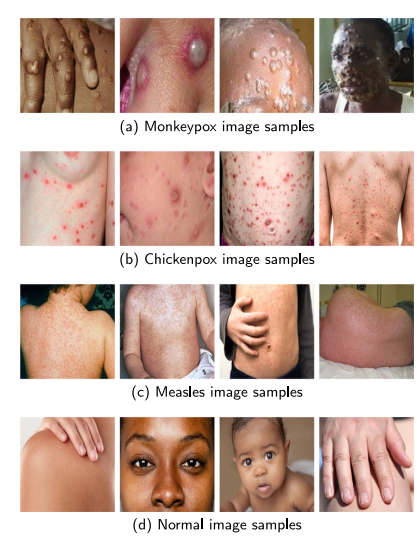# number of classes

In [ ]:
import os

# Define the path to your dataset
dataset_path = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'

# List files in the directory
files = os.listdir(dataset_path)
print(files)
print(f"Number of samples in the dataset: {len(files)}")

['Measles', 'Monkeypox', 'Normal', 'Chickenpox']
Number of samples in the dataset: 4


# display an image

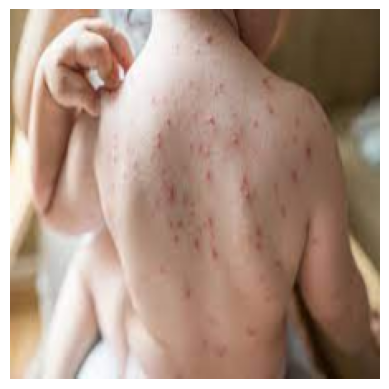

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
image_path = os.path.join(dataset_path, '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset/Chickenpox/chickenpox1.png')
image = Image.open(image_path)
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
import os
from PIL import Image
import pandas as pd

In [ ]:
# Count the number of different file types
file_types = [os.path.splitext(f)[1] for f in files]  # Extract file extensions
file_types_series = pd.Series(file_types).value_counts()
print(f"File types and their counts:\n{file_types_series}")

File types and their counts:
    4
Name: count, dtype: int64


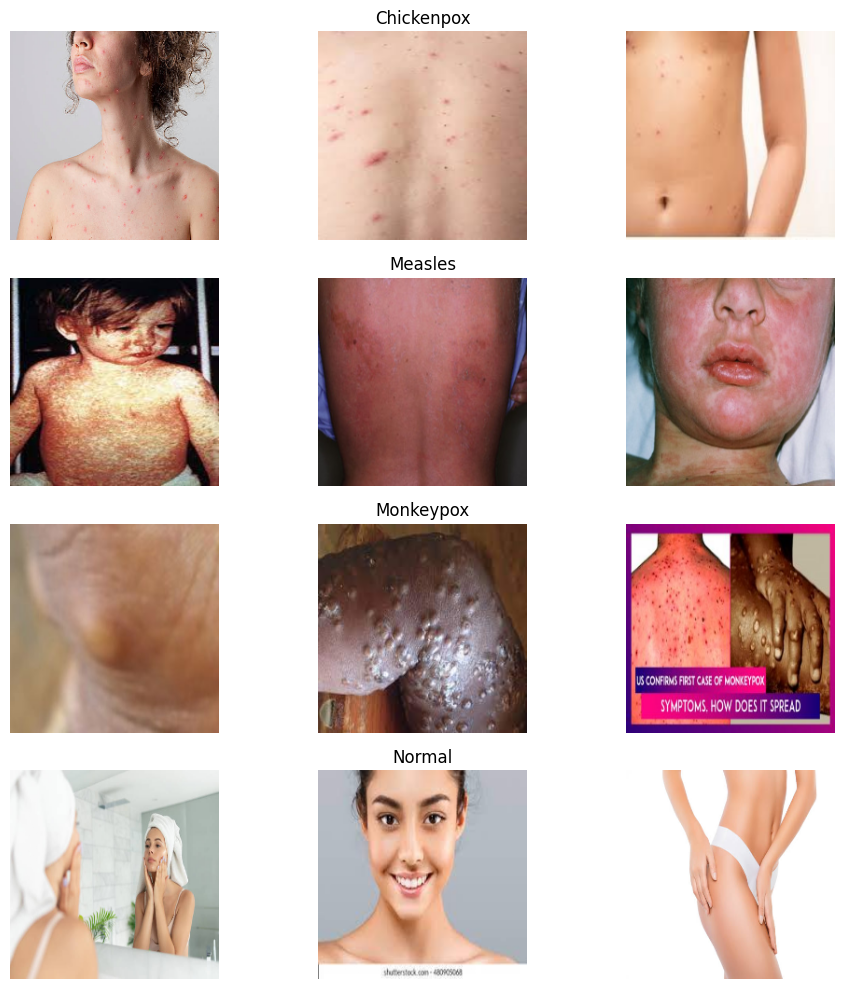

In [ ]:
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set the number of sample images to display per class
num_samples_per_class = 3

# Create a subplot for displaying sample images
fig, axes = plt.subplots(len(dataset.classes), num_samples_per_class, figsize=(10, 10))

# Loop through each class
for i, food_class in enumerate(dataset.classes):
    # Get indices of images for the current class
    class_indices = [idx for idx, (_, label) in enumerate(dataset.samples) if label == i]

    # Randomly select sample images for the current class
    sample_indices = random.sample(class_indices, num_samples_per_class)

    # Display the sample images
    for j, idx in enumerate(sample_indices):
        img_path, _ = dataset.samples[idx]
        img = mpimg.imread(img_path)

        # Plot the image
        axes[i, j].imshow(img)
        axes[i, j].axis('off')

        # Set the title as the class name
        if j == 1:
            axes[i, j].set_title(food_class)

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

# List all subdirectories and their contents

In [ ]:
# Define the dataset path
dataset_path = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'

# Initialize list to store image data
image_data = []

# Loop through each subdirectory (e.g., Monkeypox, Chickenpox, etc.)
for subdir in os.listdir(dataset_path):
    subdir_path = os.path.join(dataset_path, subdir)

    if os.path.isdir(subdir_path):
        # List all files in the subdirectory
        for img_file in os.listdir(subdir_path):
            img_path = os.path.join(subdir_path, img_file)

            try:
                with Image.open(img_path) as img:
                    img_data = {
                        "Class": subdir,  # Class label is the subdirectory name
                        "Filename": img_file,
                        "Format": img.format,
                        "Mode": img.mode,
                        "Size": img.size,  # (width, height)
                        "File Size (KB)": os.path.getsize(img_path) / 1024  # File size in KB
                    }
                    image_data.append(img_data)
            except Exception as e:
                print(f"Could not analyze {img_file}: {e}")

# Convert to a pandas DataFrame for easy viewing
image_df = pd.DataFrame(image_data)
print(image_df)

          Class           Filename Format Mode        Size  File Size (KB)
0       Measles      measles90.png    PNG  RGB  (224, 224)       72.923828
1       Measles      measles37.png    PNG  RGB  (224, 224)      101.754883
2       Measles      measles36.png    PNG  RGB  (224, 224)       86.565430
3       Measles      measles73.png    PNG  RGB  (224, 224)       73.562500
4       Measles      measles54.png    PNG  RGB  (224, 224)       70.154297
..          ...                ...    ...  ...         ...             ...
765  Chickenpox    chickenpox2.png    PNG  RGB  (224, 224)       78.394531
766  Chickenpox   chickenpox94.png    PNG  RGB  (224, 224)       68.529297
767  Chickenpox   chickenpox87.png    PNG  RGB  (224, 224)       87.226562
768  Chickenpox   chickenpox60.png    PNG  RGB  (224, 224)       59.929688
769  Chickenpox  chickenpox104.png    PNG  RGB  (224, 224)       47.958008

[770 rows x 6 columns]


# image dimensions and file sizes

In [ ]:
print(f"Average image width: {image_df['Size'].apply(lambda x: x[0]).mean()} pixels")
print(f"Average image height: {image_df['Size'].apply(lambda x: x[1]).mean()} pixels")
print(f"Average file size: {image_df['File Size (KB)'].mean()} KB")
print(f"Image count per class:\n{image_df['Class'].value_counts()}")

Average image width: 224.0 pixels
Average image height: 224.0 pixels
Average file size: 73.42009055397727 KB
Image count per class:
Class
Normal        293
Monkeypox     279
Chickenpox    107
Measles        91
Name: count, dtype: int64


In [ ]:
!pip install seaborn
import torch
from torchvision.datasets import ImageFolder
from torchvision import transforms
import matplotlib.pyplot as plt
import seaborn as sns

# Define the transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Define dataset
dataset = ImageFolder(root=dataset_path, transform=transform)

# class distribution

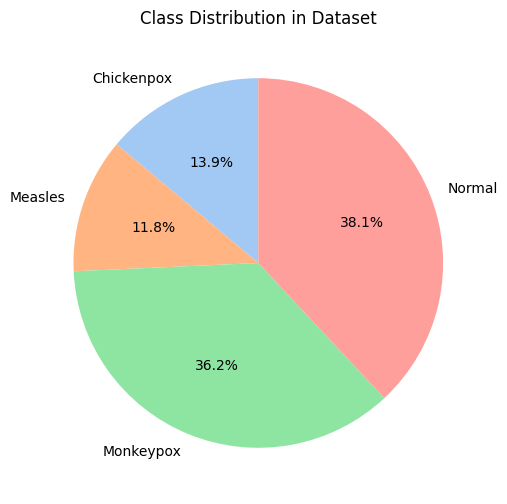

<ipython-input-9-8bb64be72b81>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=[dataset.classes[label] for _, label in dataset], palette="pastel", order=class_distribution.keys())  # Assuming 'data' has a 'label' column


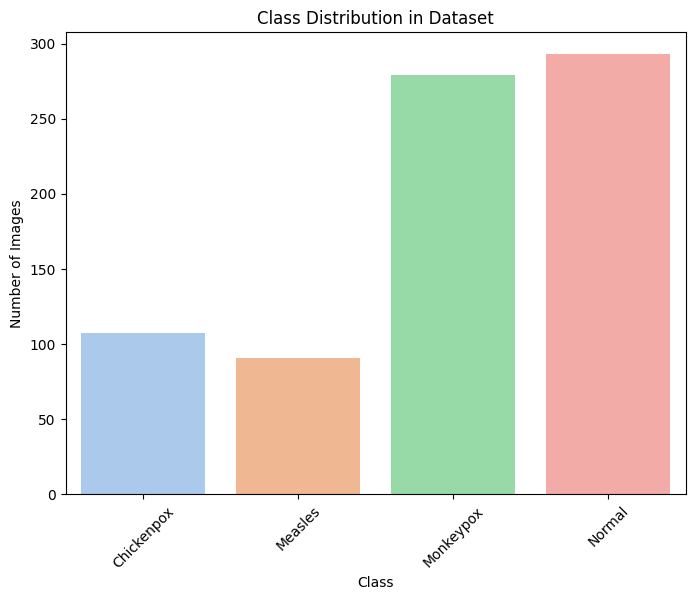

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Plot Pie Chart for Class Distribution
class_distribution =  {cls: len([img for img, label in dataset if label == idx]) for idx, cls in enumerate(dataset.classes)}

plt.figure(figsize=(8, 6))
# Extract labels (class names) and sizes (image counts) from the dictionary
labels = list(class_distribution.keys())
sizes = list(class_distribution.values())

# Use plt.pie directly with labels and sizes
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
plt.title("Class Distribution in Dataset")
plt.ylabel("")
plt.show()

plt.figure(figsize=(8, 6))
sns.countplot(x=[dataset.classes[label] for _, label in dataset], palette="pastel", order=class_distribution.keys())  # Assuming 'data' has a 'label' column
plt.title("Class Distribution in Dataset")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()

# OLD PART

# preprocessing

In [ ]:
#UNDER_SAMPLING
import os
import random
from PIL import Image
import shutil

# Define the dataset path
dataset_path = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'

# Define output path for underbalanced dataset
output_path = '/content/drive/MyDrive/project/undersampeled_DATA'

# Ensure output directory exists
os.makedirs(output_path, exist_ok=True)

# Define target number of samples for underbalancing
target_count = 107

# Function to underbalance a class
def underbalance_class(class_name, source_path, target_path, target_count):
    class_source_path = os.path.join(source_path, class_name)
    class_target_path = os.path.join(target_path, class_name)
    os.makedirs(class_target_path, exist_ok=True)

    # Get all image files in the class directory
    all_images = [img for img in os.listdir(class_source_path) if os.path.isfile(os.path.join(class_source_path, img))]

    # Randomly sample images to match the target count
    selected_images = random.sample(all_images, min(target_count, len(all_images)))

    # Copy selected images to target directory
    for img in selected_images:
        shutil.copy(os.path.join(class_source_path, img), os.path.join(class_target_path, img))

# Underbalance "Normal" and "Chickenpox" classes
underbalance_class("Normal", dataset_path, output_path, target_count)
underbalance_class("Chickenpox", dataset_path, output_path, target_count)

print("Underbalancing completed. Underbalanced dataset saved to:", output_path)


Underbalancing completed. Underbalanced dataset saved to: /content/drive/MyDrive/project/undersampeled_DATA


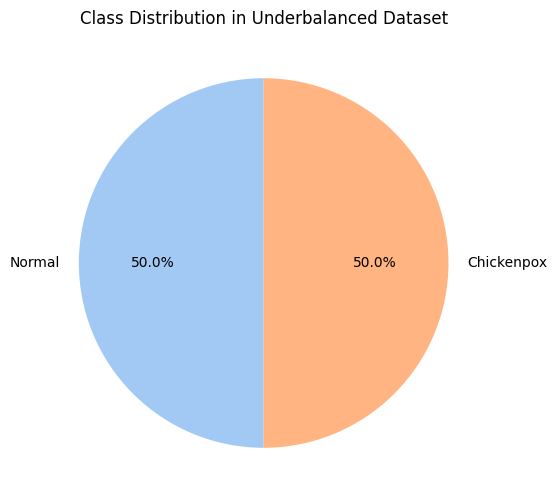

<ipython-input-12-c2410daf2b19>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


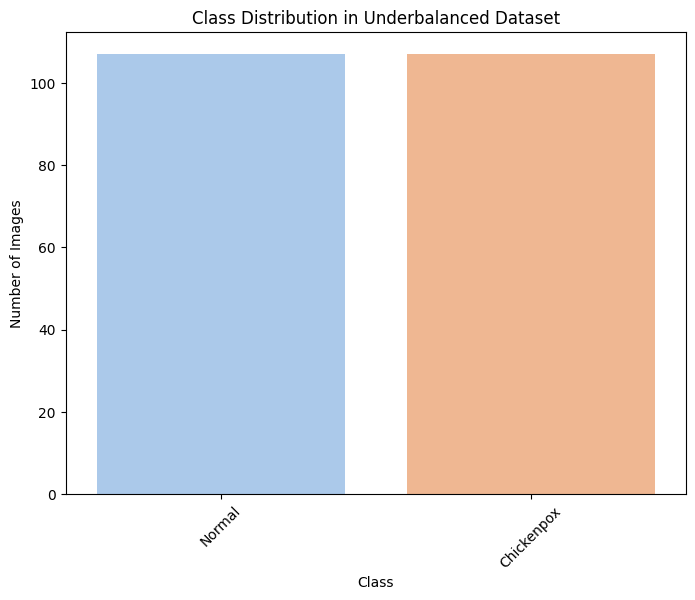

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Calculate the class distribution for the underbalanced dataset
underbalanced_path = '/content/drive/MyDrive/project/undersampeled_DATA'
underbalanced_distribution = {
    class_name: len(os.listdir(os.path.join(underbalanced_path, class_name)))
    for class_name in os.listdir(underbalanced_path)
    if os.path.isdir(os.path.join(underbalanced_path, class_name))
}

# Plot Pie Chart for Underbalanced Dataset Distribution
plt.figure(figsize=(8, 6))
labels = list(underbalanced_distribution.keys())
sizes = list(underbalanced_distribution.values())
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
plt.title("Class Distribution in Underbalanced Dataset")
plt.ylabel("")
plt.show()

# Plot Bar Chart for Underbalanced Dataset Distribution
plt.figure(figsize=(8, 6))
sns.countplot(
    x=[cls for cls, count in underbalanced_distribution.items() for _ in range(count)],
    palette="pastel",
    order=underbalanced_distribution.keys()
)
plt.title("Class Distribution in Underbalanced Dataset")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()


Underbalancing completed for Monkeypox and Chickenpox. Dataset saved to: /content/drive/MyDrive/project/undersampeled_DATA


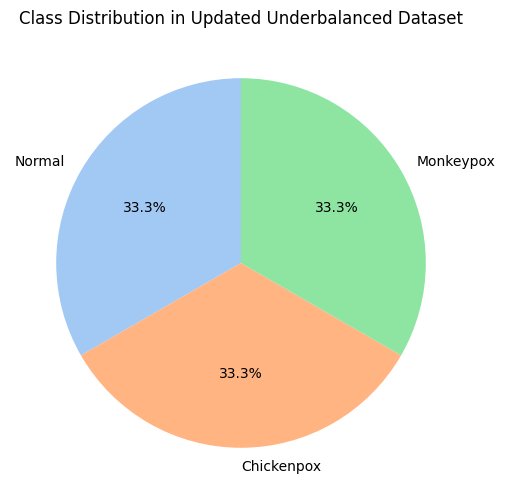

<ipython-input-13-b1179ccdbd50>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


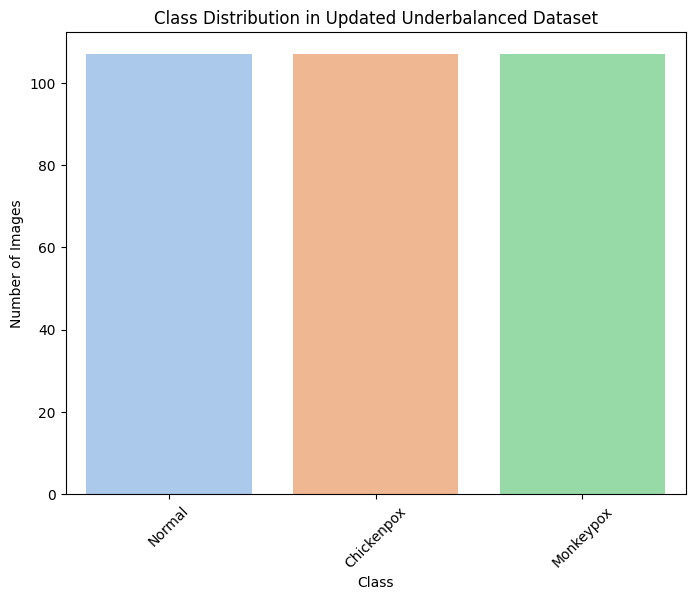

In [ ]:
# Underbalance "Monkeypox" and "Chickenpox" classes to match the target count
underbalance_class("Monkeypox", dataset_path, output_path, target_count)
underbalance_class("Chickenpox", dataset_path, output_path, target_count)

print("Underbalancing completed for Monkeypox and Chickenpox. Dataset saved to:", output_path)

# Recalculate the class distribution for the updated underbalanced dataset
underbalanced_distribution = {
    class_name: len(os.listdir(os.path.join(underbalanced_path, class_name)))
    for class_name in os.listdir(underbalanced_path)
    if os.path.isdir(os.path.join(underbalanced_path, class_name))
}

# Plot Pie Chart for Updated Underbalanced Dataset Distribution
plt.figure(figsize=(8, 6))
labels = list(underbalanced_distribution.keys())
sizes = list(underbalanced_distribution.values())
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
plt.title("Class Distribution in Updated Underbalanced Dataset")
plt.ylabel("")
plt.show()

# Plot Bar Chart for Updated Underbalanced Dataset Distribution
plt.figure(figsize=(8, 6))
sns.countplot(
    x=[cls for cls, count in underbalanced_distribution.items() for _ in range(count)],
    palette="pastel",
    order=underbalanced_distribution.keys()
)
plt.title("Class Distribution in Updated Underbalanced Dataset")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()


# Undersampling

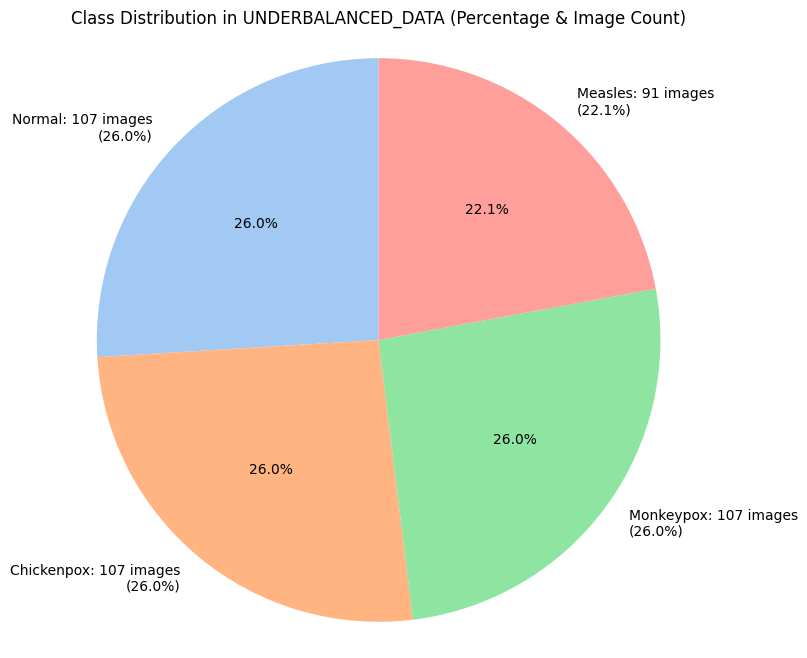

Class: Normal, Number of Images: 107, Percentage: 25.97%
Class: Chickenpox, Number of Images: 107, Percentage: 25.97%
Class: Monkeypox, Number of Images: 107, Percentage: 25.97%
Class: Measles, Number of Images: 91, Percentage: 22.09%


In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Path to the UNDERBALANCED_DATA folder
underbalanced_data_path = '/content/drive/MyDrive/project/undersampeled_DATA'

# Function to calculate class distribution and plot a pie chart with percentages and image counts
def calculate_and_plot_percentage_distribution(data_path):
    # Create a dictionary to hold the class names and their respective image counts
    class_distribution = {}

    # Loop through each folder in the data path (each class)
    for class_name in os.listdir(data_path):
        class_folder = os.path.join(data_path, class_name)

        # Check if the folder is indeed a directory (i.e., a class) and not '.ipynb_checkpoints'
        if os.path.isdir(class_folder) and class_name != '.ipynb_checkpoints':
            # Count the number of images in the current class folder
            image_files = [f for f in os.listdir(class_folder) if f.endswith('.jpg') or f.endswith('.png')]
            class_distribution[class_name] = len(image_files)

    # Calculate total number of images
    total_images = sum(class_distribution.values())

    # Calculate percentage for each class
    class_percentage = {class_name: (count / total_images) * 100 for class_name, count in class_distribution.items()}

    # Plotting the pie chart for the class distribution with percentages and image counts
    plt.figure(figsize=(8, 8))
    labels = [f"{class_name}: {count} images\n({class_percentage[class_name]:.1f}%)" for class_name, count in class_distribution.items()]
    sizes = list(class_distribution.values())
    colors = sns.color_palette("pastel", len(labels))

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
    plt.title('Class Distribution in UNDERBALANCED_DATA (Percentage & Image Count)')
    plt.axis('equal')  # Equal aspect ratio ensures that pie chart is drawn as a circle.
    plt.show()

    # Print class distribution with image counts and percentages
    for class_name, count in class_distribution.items():
        print(f'Class: {class_name}, Number of Images: {count}, Percentage: {class_percentage[class_name]:.2f}%')

# Call the function to calculate and plot the distribution with percentages as a pie chart
calculate_and_plot_percentage_distribution(underbalanced_data_path)


In [ ]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array, save_img
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
input_path = "/content/drive/MyDrive/project/Monkeypox Skin Image Dataset/Measles"
output_path = "/content/drive/MyDrive/project/undersampeled_DATA/Measles"

# Ensure the output directory exists
os.makedirs(output_path, exist_ok=True)

# Parameters
current_image_count = 91
target_image_count = 107
images_needed = target_image_count - current_image_count

# Initialize ImageDataGenerator for rotation
datagen = ImageDataGenerator(rotation_range=30)  # Rotation range of ±30 degrees

# Load all images from the input directory
image_files = [f for f in os.listdir(input_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if len(image_files) == 0:
    print("No images found in the input directory.")
else:
    print(f"Found {len(image_files)} images. Generating {images_needed} additional images by rotation...")

# Start augmentation
image_index = 0
for img_name in image_files:
    if images_needed <= 0:
        break

    # Load image
    img_path = os.path.join(input_path, img_name)
    img = load_img(img_path)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Generate rotated images
    aug_iter = datagen.flow(img_array, batch_size=1)
    for _ in range(images_needed):
        aug_img_array = next(aug_iter)[0].astype("uint8")
        aug_img_name = f"rot_{image_index}_{img_name}"
        aug_img_path = os.path.join(output_path, aug_img_name)

        # Save rotated image
        save_img(aug_img_path, aug_img_array)
        image_index += 1
        images_needed -= 1

        if images_needed <= 0:
            break

print(f"Augmentation complete. Total images in '{output_path}': {target_image_count}.")

Found 106 images. Generating 16 additional images by rotation...
Augmentation complete. Total images in '/content/drive/MyDrive/project/undersampeled_DATA/Measles': 107.


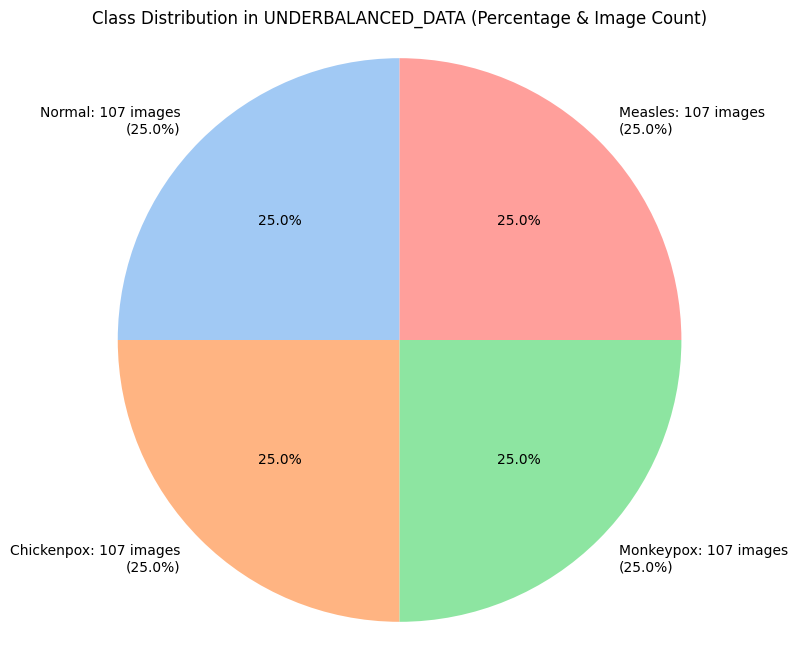

Class: Normal, Number of Images: 107, Percentage: 25.00%
Class: Chickenpox, Number of Images: 107, Percentage: 25.00%
Class: Monkeypox, Number of Images: 107, Percentage: 25.00%
Class: Measles, Number of Images: 107, Percentage: 25.00%


In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Path to the UNDERBALANCED_DATA folder
underbalanced_data_path = '/content/drive/MyDrive/project/undersampeled_DATA'

# Function to calculate class distribution and plot a pie chart with percentages and image counts
def calculate_and_plot_percentage_distribution(data_path):
    # Create a dictionary to hold the class names and their respective image counts
    class_distribution = {}

    # Loop through each folder in the data path (each class)
    for class_name in os.listdir(data_path):
        class_folder = os.path.join(data_path, class_name)

        # Check if the folder is indeed a directory (i.e., a class) and not '.ipynb_checkpoints'
        if os.path.isdir(class_folder) and class_name != '.ipynb_checkpoints':
            # Count the number of images in the current class folder
            image_files = [f for f in os.listdir(class_folder) if f.endswith('.jpg') or f.endswith('.png')]
            class_distribution[class_name] = len(image_files)

    # Calculate total number of images
    total_images = sum(class_distribution.values())

    # Calculate percentage for each class
    class_percentage = {class_name: (count / total_images) * 100 for class_name, count in class_distribution.items()}

    # Plotting the pie chart for the class distribution with percentages and image counts
    plt.figure(figsize=(8, 8))
    labels = [f"{class_name}: {count} images\n({class_percentage[class_name]:.1f}%)" for class_name, count in class_distribution.items()]
    sizes = list(class_distribution.values())
    colors = sns.color_palette("pastel", len(labels))

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
    plt.title('Class Distribution in UNDERBALANCED_DATA (Percentage & Image Count)')
    plt.axis('equal')  # Equal aspect ratio ensures that pie chart is drawn as a circle.
    plt.show()

    # Print class distribution with image counts and percentages
    for class_name, count in class_distribution.items():
        print(f'Class: {class_name}, Number of Images: {count}, Percentage: {class_percentage[class_name]:.2f}%')

# Call the function to calculate and plot the distribution with percentages as a pie chart
calculate_and_plot_percentage_distribution(underbalanced_data_path)


Found 107 images.


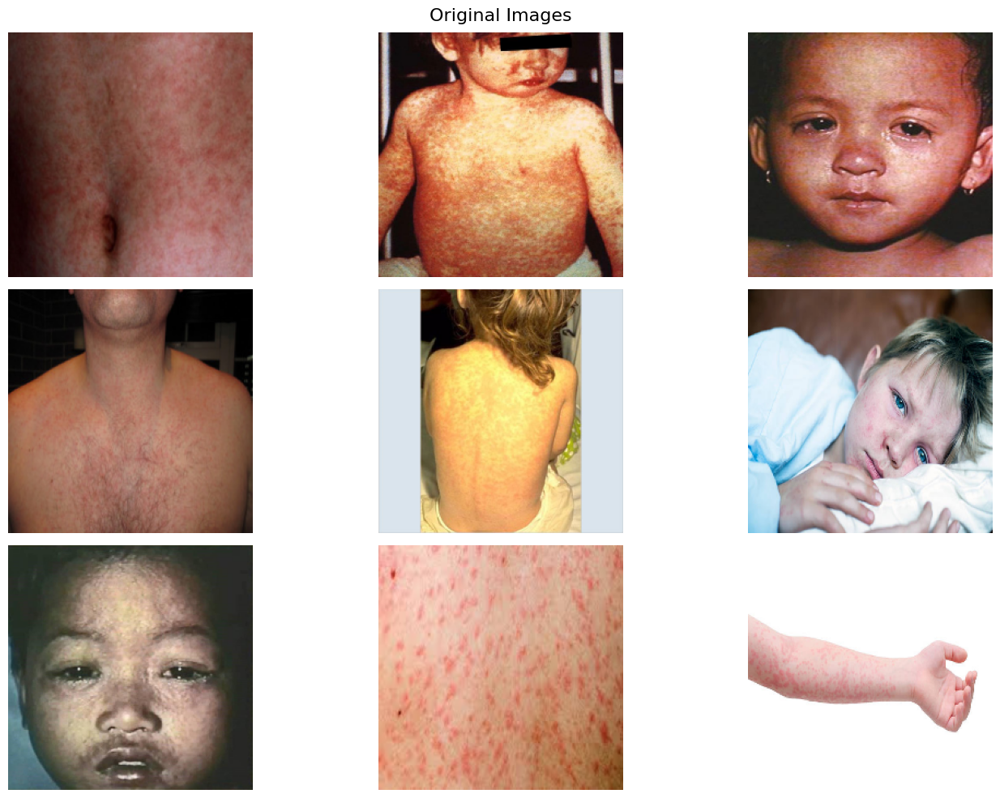

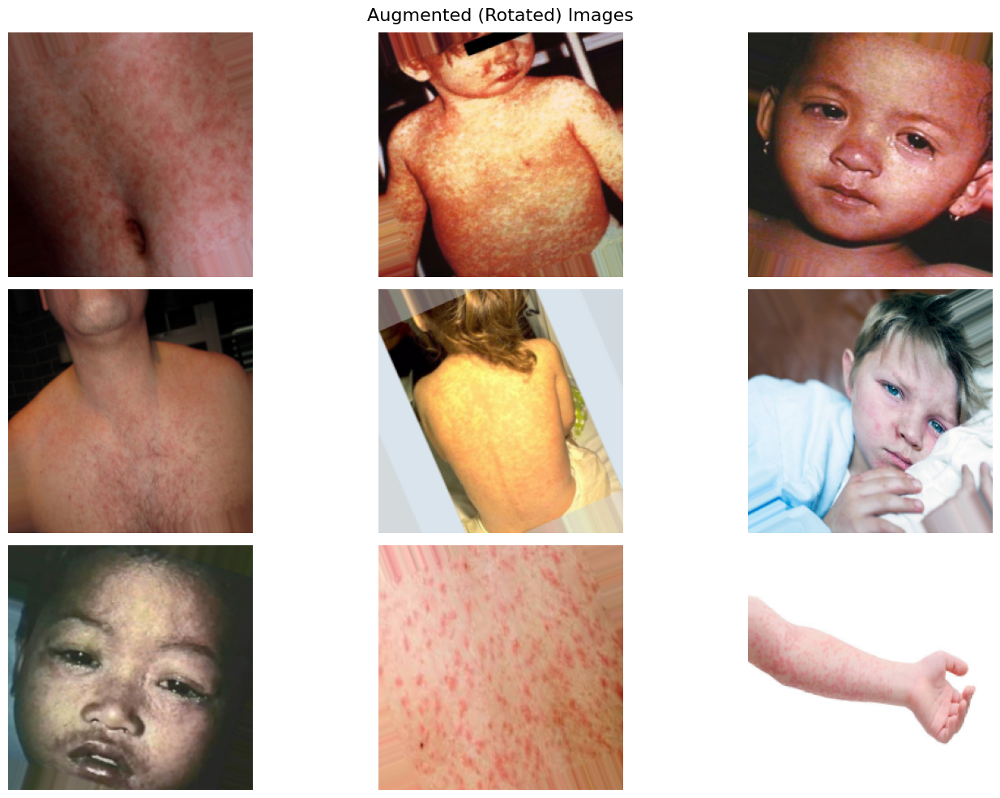

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Paths
input_path = "/content/drive/MyDrive/project/undersampeled_DATA/Measles"

# Load all images from the input directory
image_files = [f for f in os.listdir(input_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if len(image_files) == 0:
    print("No images found in the input directory.")
else:
    print(f"Found {len(image_files)} images.")

# Helper function to display images in a grid
def display_images(images, title, n_rows=3, n_cols=3):
    plt.figure(figsize=(15, 10))
    for i, img in enumerate(images[:n_rows * n_cols]):
        plt.subplot(n_rows, n_cols, i + 1)
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Display original images
original_images = []
for img_name in image_files[:9]:  # Load only the first 9 images for visualization
    img_path = os.path.join(input_path, img_name)
    img = load_img(img_path)
    original_images.append(np.array(img))

display_images(original_images, "Original Images")

# Initialize ImageDataGenerator for rotation
datagen = ImageDataGenerator(rotation_range=30)  # Rotation range of ±30 degrees

# Generate and display augmented images (rotated)
augmented_images = []
for img_name in image_files[:9]:  # Limit to first 9 images for visualization
    img_path = os.path.join(input_path, img_name)
    img = load_img(img_path)
    img_array = np.expand_dims(np.array(img), axis=0)

    # Generate rotated images (just one for visualization)
    aug_iter = datagen.flow(img_array, batch_size=1)
    aug_img_array = next(aug_iter)[0].astype("uint8")
    augmented_images.append(aug_img_array)

display_images(augmented_images, "Augmented (Rotated) Images")

# SMOTE


In [ ]:
import os
import shutil
from imblearn.over_sampling import SMOTE
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import cv2

# Path to the original UNDERBALANCED_DATA folder
underbalanced_data_path = '/content/drive/MyDrive/UNDERBALANCED_DATA'
# Path to the NEW folder to save the oversampled data
new_data_path = '/content/drive/MyDrive/NEW'

# Function to apply SMOTE and save the new data
def apply_oversampling_and_save(data_path, target_class, target_count, output_path):
    # Create output directory if it doesn't exist
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    # Step 1: Prepare the data for oversampling
    all_images = []
    all_labels = []

    # Loop through each class and collect images and labels
    for class_name in os.listdir(data_path):
        class_folder = os.path.join(data_path, class_name)

        # Skip '.ipynb_checkpoints' folder or any non-directory files
        if os.path.isdir(class_folder) and class_name != '.ipynb_checkpoints':
            class_images = []
            for img_name in os.listdir(class_folder):
                img_path = os.path.join(class_folder, img_name)

                if img_name.endswith('.jpg') or img_name.endswith('.png'):
                    # Read the image and resize it to a fixed size (e.g., 64x64 pixels)
                    img = cv2.imread(img_path)
                    img_resized = cv2.resize(img, (64, 64))
                    class_images.append(img_resized)

            # Add images and labels to the list
            all_images.extend(class_images)
            all_labels.extend([class_name] * len(class_images))

    # Convert images and labels to numpy arrays
    all_images = np.array(all_images)
    all_labels = np.array(all_labels)

    # Step 2: Encode labels as integers (since SMOTE requires numerical labels)
    label_encoder = LabelEncoder()
    all_labels_encoded = label_encoder.fit_transform(all_labels)

    # Step 3: Apply SMOTE only for the target class
    target_class_index = label_encoder.transform([target_class])[0]

    # Apply SMOTE for the 'Measles' class
    smote = SMOTE(sampling_strategy={target_class_index: target_count}, random_state=42)

    # Apply SMOTE on the entire dataset (this includes all classes)
    all_images_reshaped = all_images.reshape(all_images.shape[0], -1)  # Flatten images to 1D array
    all_images_oversampled, all_labels_oversampled = smote.fit_resample(all_images_reshaped, all_labels_encoded)

    # Reshape oversampled images back to their original shape (64x64 pixels, 3 channels)
    all_images_oversampled = all_images_oversampled.reshape(all_images_oversampled.shape[0], 64, 64, 3)

    # Step 4: Save the oversampled dataset into the new directory
    for i, class_name in enumerate(label_encoder.classes_):
        class_folder_output = os.path.join(output_path, class_name)
        if not os.path.exists(class_folder_output):
            os.makedirs(class_folder_output)

        # Get the images and save them in their respective folders
        class_images_oversampled = all_images_oversampled[all_labels_oversampled == i]
        for j, img in enumerate(class_images_oversampled):
            img_path = os.path.join(class_folder_output, f"{class_name}_{j+1}.png")
            cv2.imwrite(img_path, img)

    print(f"Oversampling for class '{target_class}' completed. Data saved to {output_path}")

# Apply oversampling for the 'Measles' class to reach 107 images and save to the 'NEW' folder
apply_oversampling_and_save(underbalanced_data_path, 'Measles', 107, new_data_path)


Oversampling for class 'Measles' completed. Data saved to /content/drive/MyDrive/NEW


In [ ]:
import os

# Path to the NEW folder
new_data_path = '/content/drive/MyDrive/NEW'

# Function to count the number of images in each class in the NEW folder
def count_images_in_new_folder(new_data_path):
    class_image_counts = {}

    # Loop through each class in the "NEW" folder
    for class_name in os.listdir(new_data_path):
        class_folder = os.path.join(new_data_path, class_name)

        # Skip if it's not a directory
        if os.path.isdir(class_folder):
            # Count the number of images in the class folder
            image_count = len([img for img in os.listdir(class_folder) if img.endswith('.png') or img.endswith('.jpg')])
            class_image_counts[class_name] = image_count

    return class_image_counts

# Get the image counts for each class in the NEW folder
image_counts = count_images_in_new_folder(new_data_path)

# Print the image counts for each class
for class_name, count in image_counts.items():
    print(f"Class: {class_name}, Number of Images: {count}")


Class: Chickenpox, Number of Images: 107
Class: Measles, Number of Images: 107
Class: Monkeypox, Number of Images: 107
Class: Normal, Number of Images: 107


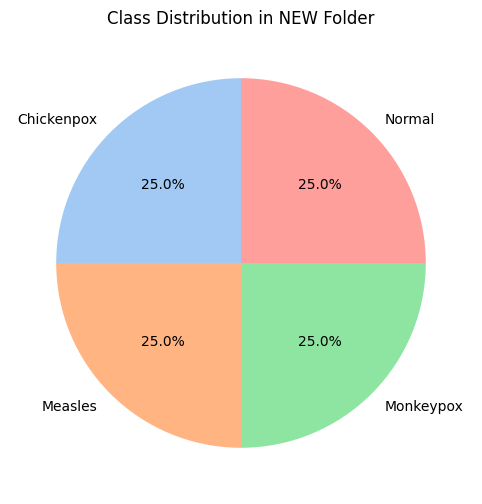

<ipython-input-47-a807768c743d>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_image_counts.keys()), y=list(class_image_counts.values()), palette="pastel")


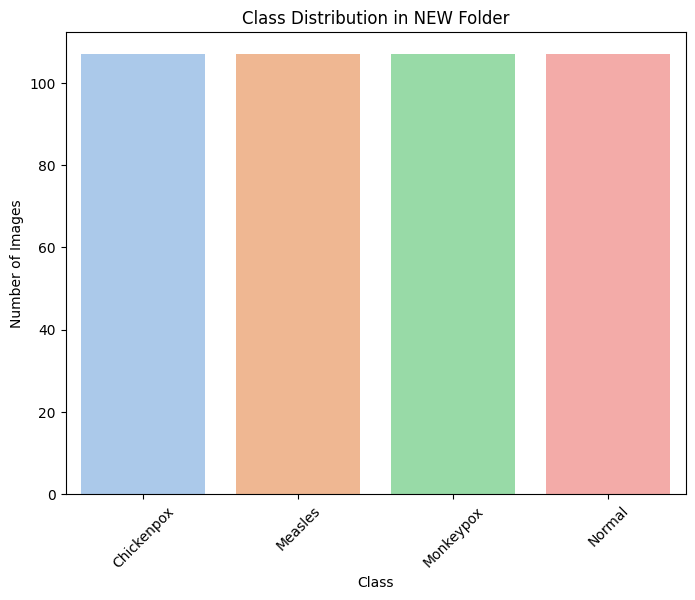

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to plot distribution (pie and bar charts)
def plot_class_distribution(class_image_counts):
    # Plot Pie Chart for Class Distribution
    plt.figure(figsize=(8, 6))
    labels = class_image_counts.keys()
    sizes = class_image_counts.values()

    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
    plt.title("Class Distribution in NEW Folder")
    plt.ylabel("")
    plt.show()

    # Plot Bar Chart for Class Distribution
    plt.figure(figsize=(8, 6))
    sns.barplot(x=list(class_image_counts.keys()), y=list(class_image_counts.values()), palette="pastel")
    plt.title("Class Distribution in NEW Folder")
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.show()

# Plot the distribution
plot_class_distribution(image_counts)


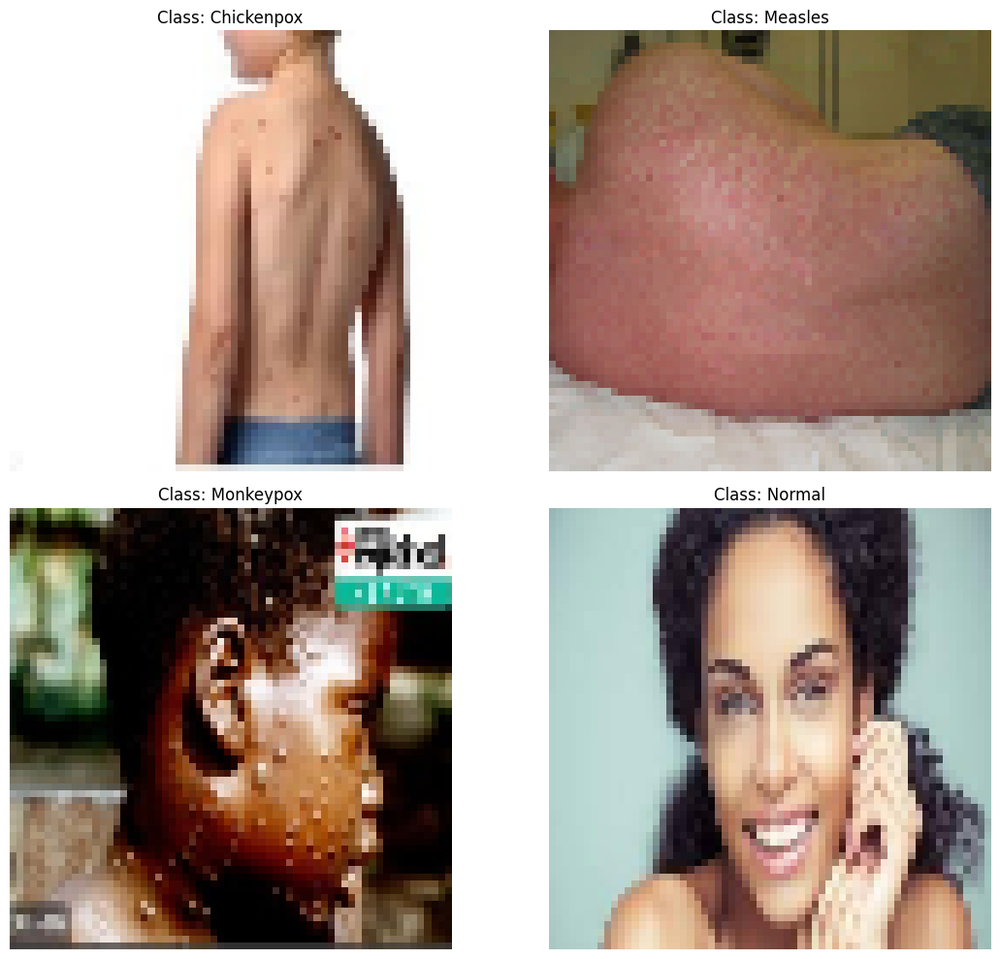

In [ ]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Path to the NEW folder
new_data_path = '/content/drive/MyDrive/NEW'

# Function to display a random image from each class
def display_random_images(new_data_path):
    # Create a figure to display the images
    plt.figure(figsize=(12, 10))

    # Loop through each class and select a random image
    for i, class_name in enumerate(os.listdir(new_data_path)):
        class_folder = os.path.join(new_data_path, class_name)

        # Skip if it's not a directory
        if os.path.isdir(class_folder):
            # Get all images in the class folder
            images = [img for img in os.listdir(class_folder) if img.endswith('.png') or img.endswith('.jpg')]

            # Select a random image
            random_image = random.choice(images)

            # Load the image using PIL
            img_path = os.path.join(class_folder, random_image)
            img = Image.open(img_path)

            # Display image as is, without resizing
            plt.subplot(2, 2, i + 1)  # Create a subplot for each image
            plt.imshow(img)  # Display original image

            plt.title(f"Class: {class_name}")
            plt.axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Display a random image from each class
display_random_images(new_data_path)


In [ ]:
import shutil

# Define the source and destination paths
source_path = "/content/drive/MyDrive/project/Monkeypox Skin Image Dataset/Measles"
destination_path = "/content/drive/MyDrive/project/undersampeled_DATA/Measles"

# Copy the directory
try:
    shutil.copytree(source_path, destination_path)
    print(f"Directory 'Measles' copied successfully to {destination_path}")
except FileExistsError:
    print(f"The destination directory '{destination_path}' already exists.")
except FileNotFoundError:
    print("Source directory not found. Please check the source path.")
except Exception as e:
    print(f"An error occurred: {e}")

Directory 'Measles' copied successfully to /content/drive/MyDrive/project/undersampeled_DATA/Measles


In [ ]:
pip install opencv-python numpy

# ADASYN


In [ ]:
import numpy as np
import os
import random
import shutil
import cv2
from imblearn.over_sampling import ADASYN
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from collections import Counter

# 1. Loading data from the path
data_path = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'
output_path = '/content/drive/MyDrive/UNDERBALANCED2_DATA'
new_data_path = '/content/drive/MyDrive/project/NEW'

categories = ['Normal', 'Chickenpox', 'Monkeypox', 'Measles']

# Data preparation function
def load_data(data_path):
    X = []
    y = []

    for idx, category in enumerate(categories):
        category_path = os.path.join(data_path, category)
        for filename in os.listdir(category_path):
            img_path = os.path.join(category_path, filename)
            if img_path.endswith(".jpg") or img_path.endswith(".png"):
                img = cv2.imread(img_path)
                img_resized = cv2.resize(img, (64, 64))  # Resize to 64x64
                X.append(img_resized)
                y.append(idx)

    X = np.array(X)
    y = np.array(y)
    return X, y

# Load the data
X, y = load_data(data_path)

# 2. Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the number of samples in each class before applying ADASYN
print("Before applying ADASYN:")
print(f"Number of samples in each class (before): {Counter(y_train)}")

sampling_strategy = {1: 200, 3: 200}  # Increase "Chickenpox" and "Measles" to 200

# Apply ADASYN (oversample underrepresented classes)
adasyn = ADASYN(sampling_strategy=sampling_strategy, random_state=42)
X_train_reshaped = X_train.reshape(X_train.shape[0], -1)  # Flatten images
X_res, y_res = adasyn.fit_resample(X_train_reshaped, y_train)
# 4. Apply CNN on the data after applying ADASYN
# Reshape the data back to its original shape for CNN input
X_res = X_res.reshape(X_res.shape[0], 64, 64, 3)  # Reshape to (64x64x3)
X_test = X_test.reshape(X_test.shape[0], 64, 64, 3)

# Convert labels to categorical format for CNN
y_res = to_categorical(y_res, num_classes=len(categories))
y_test = to_categorical(y_test, num_classes=len(categories))

Before applying ADASYN:
Number of samples in each class (before): Counter({0: 231, 2: 229, 1: 86, 3: 70})


In [ ]:
print("After applying ADASYN:")
print(f"Number of samples in each class (after): {Counter(np.argmax(y_res, axis=1))}")

After applying ADASYN:
Number of samples in each class (after): Counter({0: 231, 2: 229, 3: 201, 1: 192})


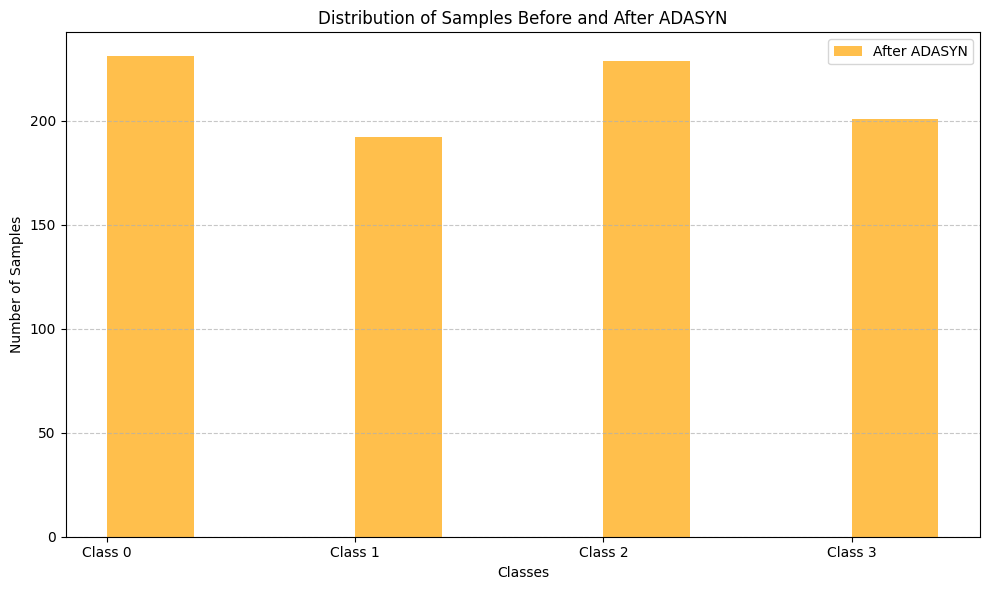

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter

after_counts = Counter({0: 231, 2: 229, 3: 201, 1: 192})


labels = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
after_values = [after_counts[i] for i in range(4)]

x = range(len(labels))
width = 0.35
plt.figure(figsize=(10, 6))
plt.bar([p + width for p in x], after_values, width, label='After ADASYN', color='orange', alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.title('Distribution of Samples Before and After ADASYN')
plt.xticks([p + width / 2 for p in x], labels)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# under sampling for all classes


In [ ]:
import os
from collections import Counter

# Define the dataset directory
dataset_dir = '/content/drive/MyDrive/dr rana project/Monkeypox Skin Image Dataset'
class_counts = {class_name: len(os.listdir(os.path.join(dataset_dir, class_name))) for class_name in os.listdir(dataset_dir)}
min_count = min(class_counts.values())

print("Class distribution:", class_counts)
print("Number of images to use per class:", min_count)

Class distribution: {'Measles': 91, 'Monkeypox': 279, 'Normal': 293, 'Chickenpox': 107}
Number of images to use per class: 91


In [ ]:
import shutil
import random
import os

# Directory to save balanced dataset
balanced_dataset_dir = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'

# Check if the directory exists and is a directory
if os.path.exists(balanced_dataset_dir) and os.path.isdir(balanced_dataset_dir):
    print(f"Directory '{balanced_dataset_dir}' already exists. Skipping creation.")
else:
    # If not, create it or handle any other cases
    try:
        os.makedirs(balanced_dataset_dir, exist_ok=True)
        print(f"Directory '{balanced_dataset_dir}' created successfully.")
    except FileExistsError:
        print(f"A file with the name '{balanced_dataset_dir}' already exists. Please rename or remove it.")
    except Exception as e:
        print(f"An error occurred while creating the directory: {e}")


for class_name, count in class_counts.items():
    class_dir = os.path.join(dataset_dir, class_name)
    balanced_class_dir = os.path.join(balanced_dataset_dir, class_name)

    # Check if the subdirectory exists and is a directory
    if os.path.exists(balanced_class_dir) and os.path.isdir(balanced_class_dir):
        print(f"Subdirectory '{balanced_class_dir}' already exists. Skipping creation.")
    else:
        # If not, create it or handle any other cases
        try:
            os.makedirs(balanced_class_dir, exist_ok=True)
            print(f"Subdirectory '{balanced_class_dir}' created successfully.")
        except FileExistsError:
            print(f"A file with the name '{balanced_class_dir}' already exists. Please rename or remove it.")
        except Exception as e:
            print(f"An error occurred while creating the subdirectory: {e}")

    # Get all images in the class directory
    images = os.listdir(class_dir)

    # Randomly select min_count images for each class
    selected_images = random.sample(images, min_count)

    # Copy selected images to the new directory
    for img_name in selected_images:
        shutil.copy(os.path.join(class_dir, img_name), balanced_class_dir)

print("Undersampling complete: Balanced dataset created at", balanced_dataset_dir)

Directory '/content/drive/MyDrive/dr rana project/under sampling data set' created successfully.
Subdirectory '/content/drive/MyDrive/dr rana project/under sampling data set/Measles' created successfully.
Subdirectory '/content/drive/MyDrive/dr rana project/under sampling data set/Monkeypox' created successfully.
Subdirectory '/content/drive/MyDrive/dr rana project/under sampling data set/Normal' created successfully.
Subdirectory '/content/drive/MyDrive/dr rana project/under sampling data set/Chickenpox' created successfully.
Undersampling complete: Balanced dataset created at /content/drive/MyDrive/dr rana project/under sampling data set


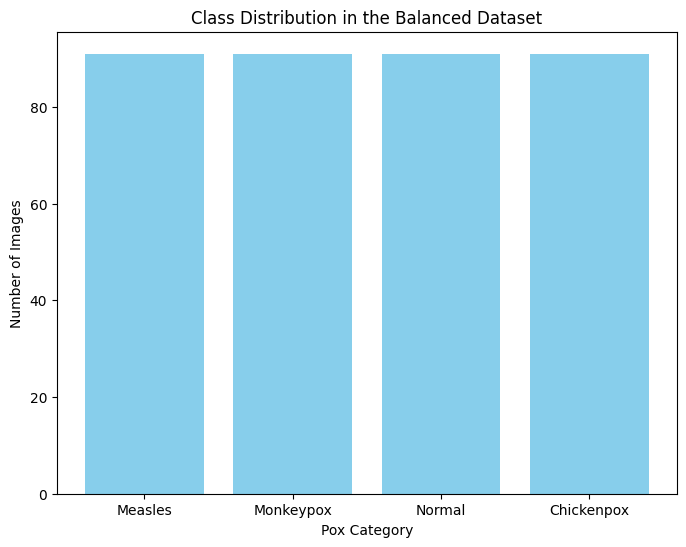

In [ ]:
import os
import matplotlib.pyplot as plt


# Count the number of images in each class
balanced_class_counts = {class_name: len(os.listdir(os.path.join(balanced_dataset_dir, class_name))) for class_name in os.listdir(balanced_dataset_dir)}

# Plotting the balanced class distribution
plt.figure(figsize=(8, 6))
plt.bar(balanced_class_counts.keys(), balanced_class_counts.values(), color='skyblue')
plt.title("Class Distribution in the Balanced Dataset")
plt.xlabel("Pox Category")
plt.ylabel("Number of Images")
plt.show()

oversampling

In [ ]:
import os
import shutil
from collections import Counter
from sklearn.utils import resample

# Step 1: Load dataset paths and labels
dataset_path = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'
output_dir = '/content/drive/MyDrive/project/over_sampling_balanced_data'
os.makedirs(output_dir, exist_ok=True)

# Get class names and their image paths
classes = os.listdir(dataset_path)
data = []
labels = []

for class_name in classes:
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            img_path = os.path.join(class_path, img_file)
            data.append(img_path)
            labels.append(class_name)

# Step 2: Count class distribution
class_counts = Counter(labels)
max_count = max(class_counts.values())  # Determine the largest class count
print("Original class distribution:", class_counts)

# Step 3: Oversample each class to match the largest class
for class_name, count in class_counts.items():
    class_path = os.path.join(dataset_path, class_name)
    output_class_dir = os.path.join(output_dir, class_name)
    os.makedirs(output_class_dir, exist_ok=True)

    # Get all images for this class
    class_images = [os.path.join(class_path, img) for img in os.listdir(class_path)]

    # Oversample the class
    oversampled_images = resample(class_images, replace=True, n_samples=max_count, random_state=42)

    # Step 4: Copy oversampled images to the output directory
    for i, img_path in enumerate(oversampled_images):
        img_name = f"{class_name}_oversampled_{i}.jpg"  # Generate a new name for the image
        shutil.copy(img_path, os.path.join(output_class_dir, img_name))

print(f"Oversampled dataset saved to: {output_dir}")


Original class distribution: Counter({'Normal': 293, 'Monkeypox': 279, 'Chickenpox': 107, 'Measles': 91})
Oversampled dataset saved to: /content/drive/MyDrive/project/over_sampling_balanced_data


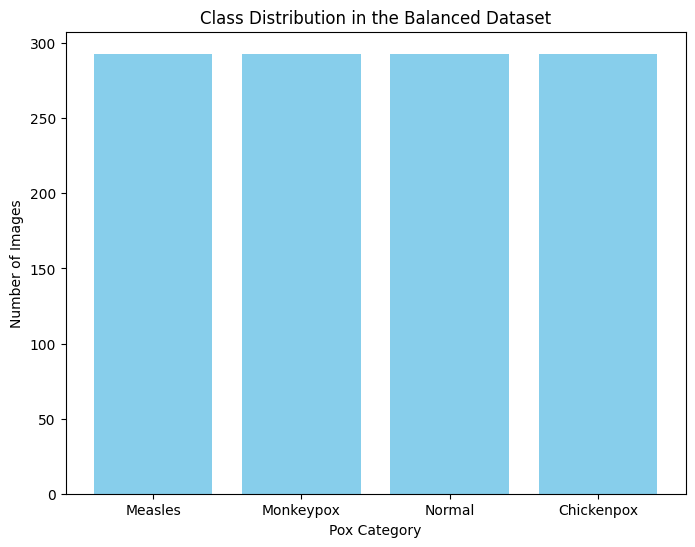

In [ ]:
import os
import matplotlib.pyplot as plt

# Define the path to the balanced dataset directory
balanced_dataset_dir = '/content/drive/MyDrive/project/Monkeypox Skin Image Dataset'  # Replace with your actual path
output_dir = '/content/drive/MyDrive/project/over_sampling_balanced_data'  # Replace with the correct output directory path

# Count the number of images in each class
balanced_class_counts = {class_name: len(os.listdir(os.path.join(output_dir, class_name))) for class_name in os.listdir(output_dir)} # Use output_dir here

# Plotting the balanced class distribution
plt.figure(figsize=(8, 6))
plt.bar(balanced_class_counts.keys(), balanced_class_counts.values(), color='skyblue')
plt.title("Class Distribution in the Balanced Dataset")
plt.xlabel("Pox Category")
plt.ylabel("Number of Images")
plt.show()

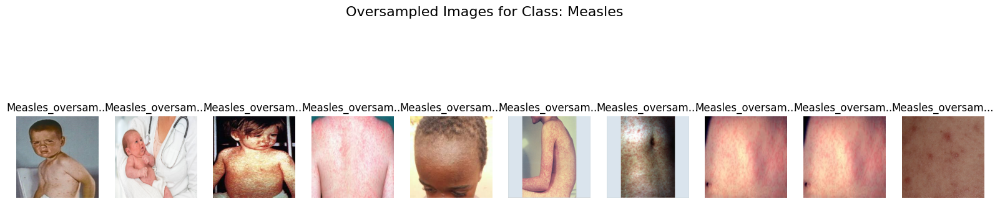

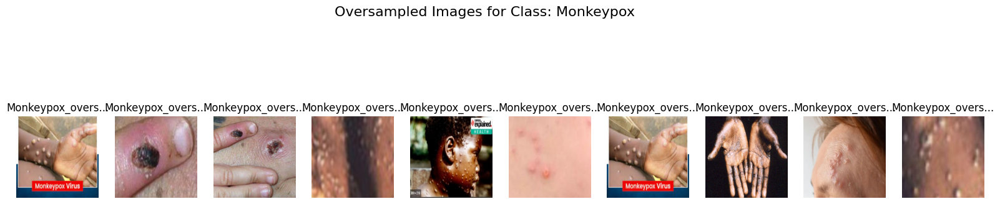

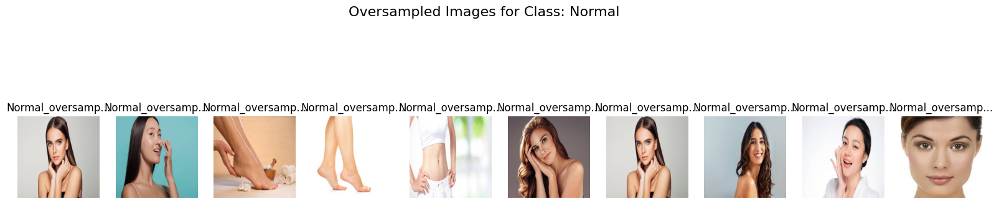

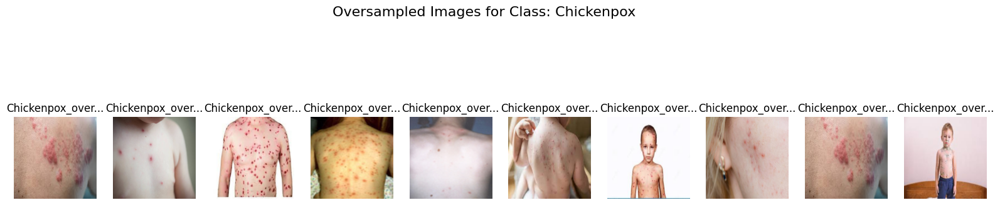

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Function to visualize oversampled images
def visualize_oversampled_images(output_dir, classes, num_images=10):
    for class_name in classes:
        output_class_dir = os.path.join(output_dir, class_name)
        if os.path.exists(output_class_dir):  # Check if the directory for the class exists
            oversampled_images = os.listdir(output_class_dir)[:num_images]

            # Set up the plot for displaying images
            fig, axes = plt.subplots(1, len(oversampled_images), figsize=(20, 5))
            fig.suptitle(f"Oversampled Images for Class: {class_name}", fontsize=16)

            for i, img_name in enumerate(oversampled_images):
                img_path = os.path.join(output_class_dir, img_name)
                img = Image.open(img_path)
                axes[i].imshow(img)
                axes[i].axis("off")  # Hide axis for a cleaner view
                axes[i].set_title(img_name[:15] + "...")  # Optional: Display partial image name

            plt.show()
        else:
            print(f"Directory for class {class_name} does not exist.")

# Call the function to display images
visualize_oversampled_images(output_dir, classes)

# Normalization

In [ ]:
import os
import cv2
import numpy as np

# Paths
input_dir = '/content/drive/MyDrive/project/undersampeled_DATA'
output_dir = '/content/drive/MyDrive/project/normalized Monkeypox Skin Image Dataset'

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Normalize function
def normalize_image(image):
    """Normalize image to have pixel values between 0 and 1."""
    image = image.astype(np.float32)
    normalized_image = cv2.normalize(image, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return (normalized_image * 255).astype(np.uint8)  # Rescale to 0-255 for saving

# Process each class
for class_name in os.listdir(input_dir):
    class_path = os.path.join(input_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Create class directory in the output path
    output_class_path = os.path.join(output_dir, class_name)
    os.makedirs(output_class_path, exist_ok=True)

    # Process each image in the class
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        # Read image
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Failed to read {img_path}. Skipping.")
            continue

        # Normalize the image
        normalized_img = normalize_image(img)

        # Save the normalized image
        output_img_path = os.path.join(output_class_path, img_name)
        cv2.imwrite(output_img_path, normalized_img)

print("Normalization complete. Normalized images saved in:", output_dir)

Normalization complete. Normalized images saved in: /content/drive/MyDrive/project/normalized Monkeypox Skin Image Dataset


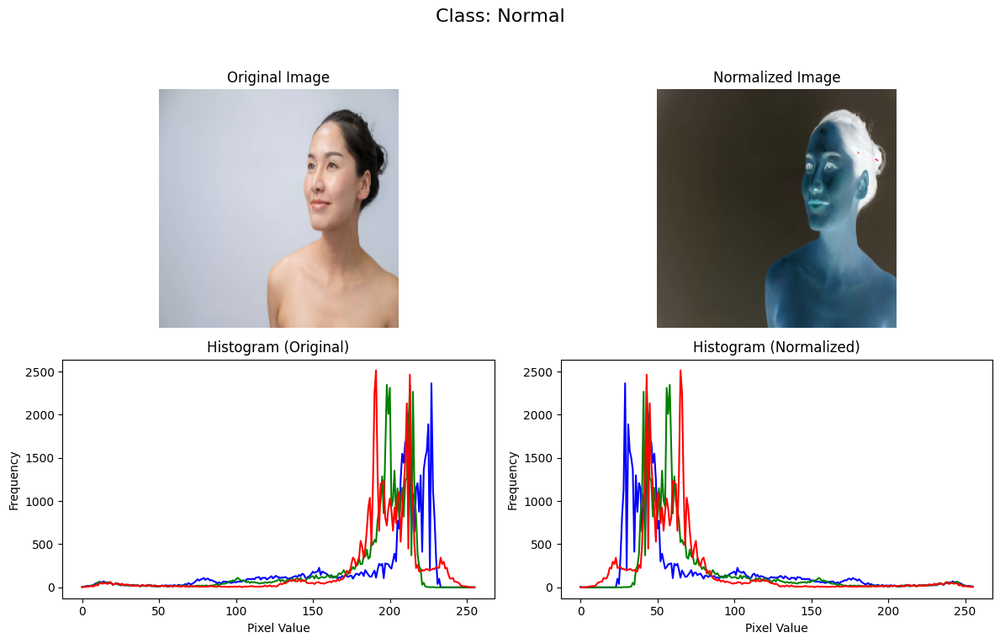

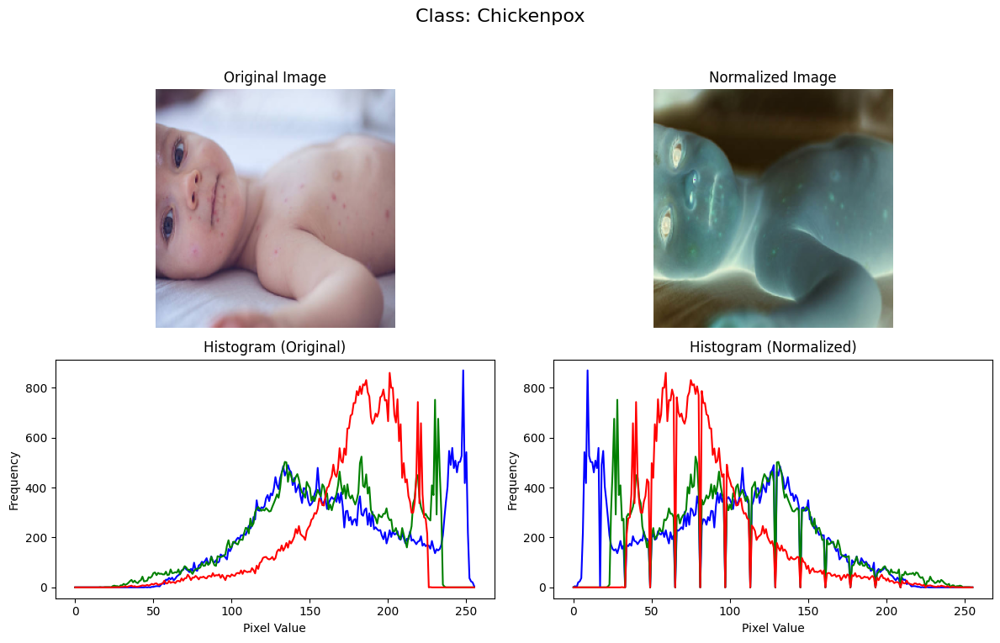

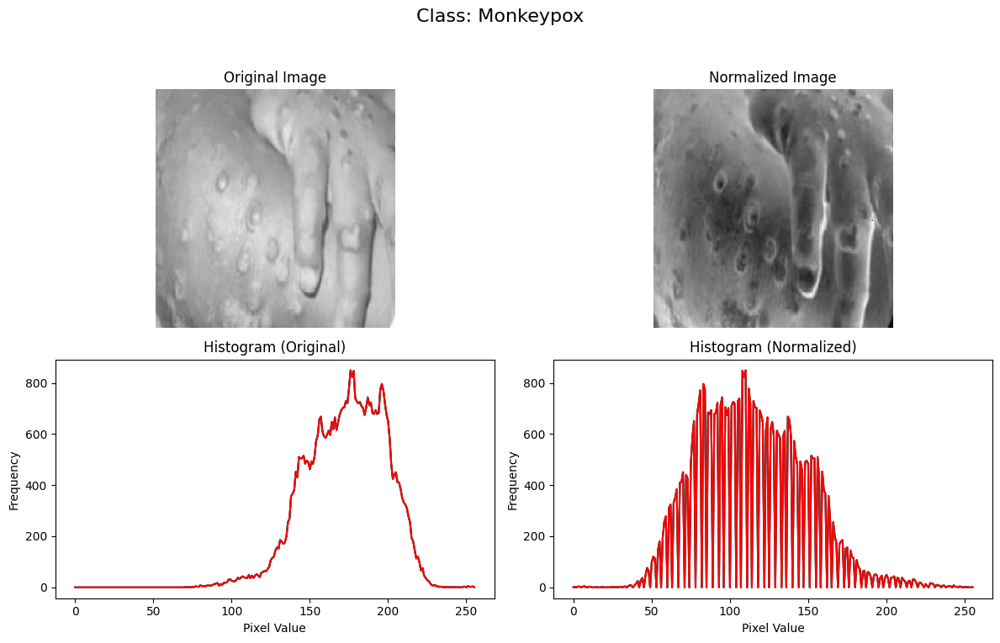

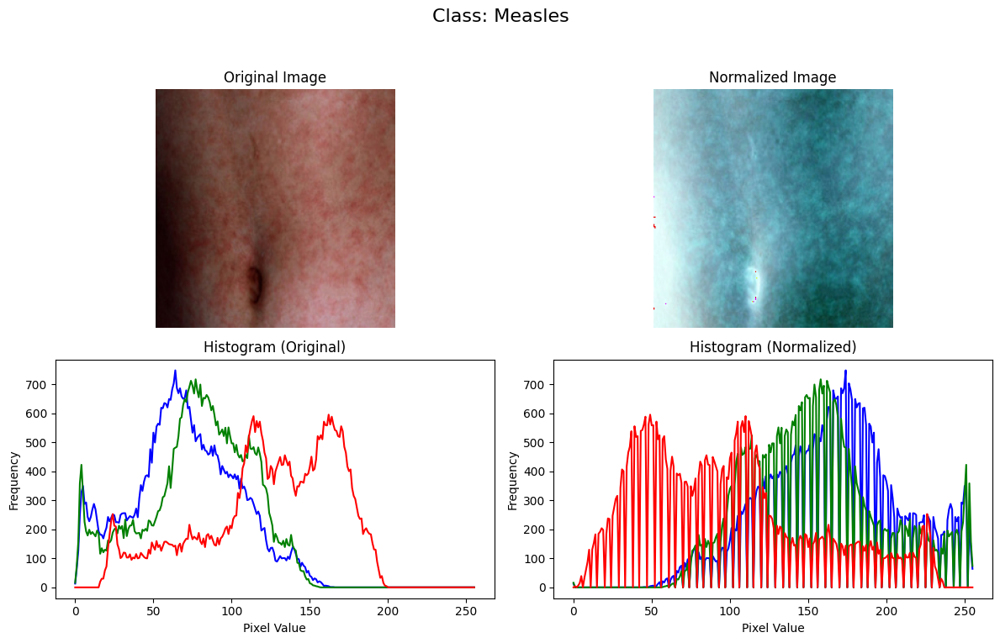

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

normalized_image ='/content/drive/MyDrive/project/normalized Monkeypox Skin Image Dataset'

# Display function
def plot_image_and_histogram(image, normalized_image, class_name):
    """Plot the original and normalized image along with their histograms."""
    # Convert normalized image back to range 0-255 for visualization
    normalized_image_display = (normalized_image * 255).astype(np.uint8)

    # Plot images
    plt.figure(figsize=(12, 8))
    plt.suptitle(f"Class: {class_name}", fontsize=16)

    plt.subplot(2, 2, 1)
    plt.title("Original Image")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.title("Normalized Image")
    plt.imshow(cv2.cvtColor(normalized_image_display, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Plot histograms
    plt.subplot(2, 2, 3)
    plt.title("Histogram (Original)")
    for i, color in enumerate(['b', 'g', 'r']):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.subplot(2, 2, 4)
    plt.title("Histogram (Normalized)")
    for i, color in enumerate(['b', 'g', 'r']):
        hist = cv2.calcHist([normalized_image_display], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Process each class
for class_name in os.listdir(input_dir):
    class_path = os.path.join(input_dir, class_name)
    if not os.path.isdir(class_path):
        continue

    # Pick the first image as a sample
    sample_image_name = next((img for img in os.listdir(class_path) if img.lower().endswith(('png', 'jpg', 'jpeg'))), None)
    if sample_image_name is None:
        print(f"No valid images found in class {class_name}. Skipping.")
        continue

    # Load the image
    sample_image_path = os.path.join(class_path, sample_image_name)
    sample_image = cv2.imread(sample_image_path)
    if sample_image is None:
        print(f"Failed to read image: {sample_image_path}. Skipping.")
        continue

    # Normalize the image
    normalized_sample_image = normalize_image(sample_image)

    # Plot the image and its histogram
    plot_image_and_histogram(sample_image, normalized_sample_image, class_name)

# Histogram Equilization

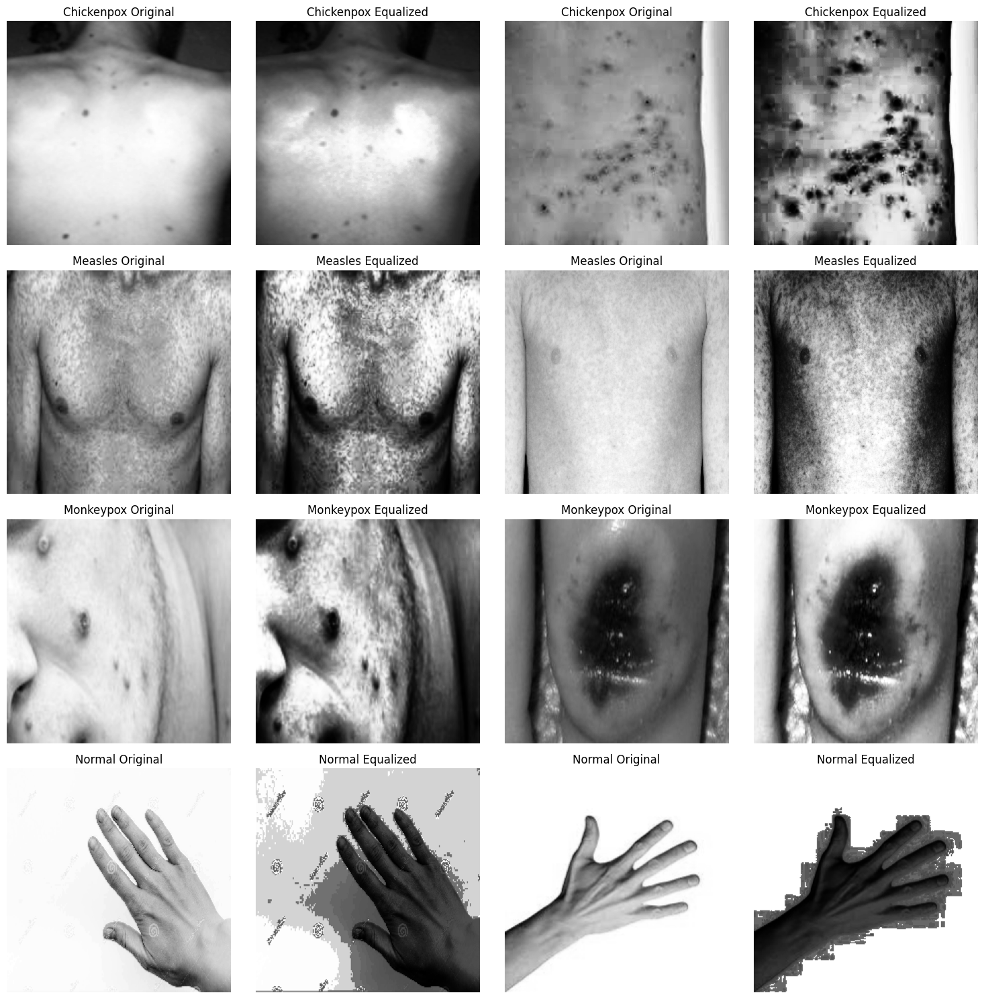

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define the dataset path
dataset_path = '/content/drive/MyDrive/project/normalized Monkeypox Skin Image Dataset'

# Set the number of sample images to display per class
num_samples_per_class = 2

# Define the output directory for the equalized images
output_path = '/content/drive/MyDrive/project/equlized Monkeypox Skin Image Dataset'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Get the list of classes (subdirectories)
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])

# Create a subplot for displaying sample images
fig, axes = plt.subplots(len(classes), num_samples_per_class * 2, figsize=(15, 15))

# Loop through each class
for i, food_class in enumerate(classes):
    class_path = os.path.join(dataset_path, food_class)

    # Get all image files in the class directory
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]

    # Randomly select sample images for the current class
    sample_files = random.sample(image_files, min(num_samples_per_class, len(image_files)))

    # Display the sample images
    for j, file_name in enumerate(sample_files):
        img_path = os.path.join(class_path, file_name)

        # Load the image in grayscale
        img = cv2.imread(img_path, 0)

        # Apply histogram equalization
        equ = cv2.equalizeHist(img)

        # Plot the original image
        axes[i, j * 2].imshow(img, cmap='gray')
        axes[i, j * 2].axis('off')
        axes[i, j * 2].set_title(food_class + " Original")

        # Plot the equalized image
        axes[i, j * 2 + 1].imshow(equ, cmap='gray')
        axes[i, j * 2 + 1].axis('off')
        axes[i, j * 2 + 1].set_title(food_class + " Equalized")

        # Save the equalized image to the output directory
        equalized_image_path = os.path.join(output_path, food_class)
        os.makedirs(equalized_image_path, exist_ok=True)
        save_path = os.path.join(equalized_image_path, f"equalized_{file_name}")

        # Save the equalized image
        cv2.imwrite(save_path, equ)

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

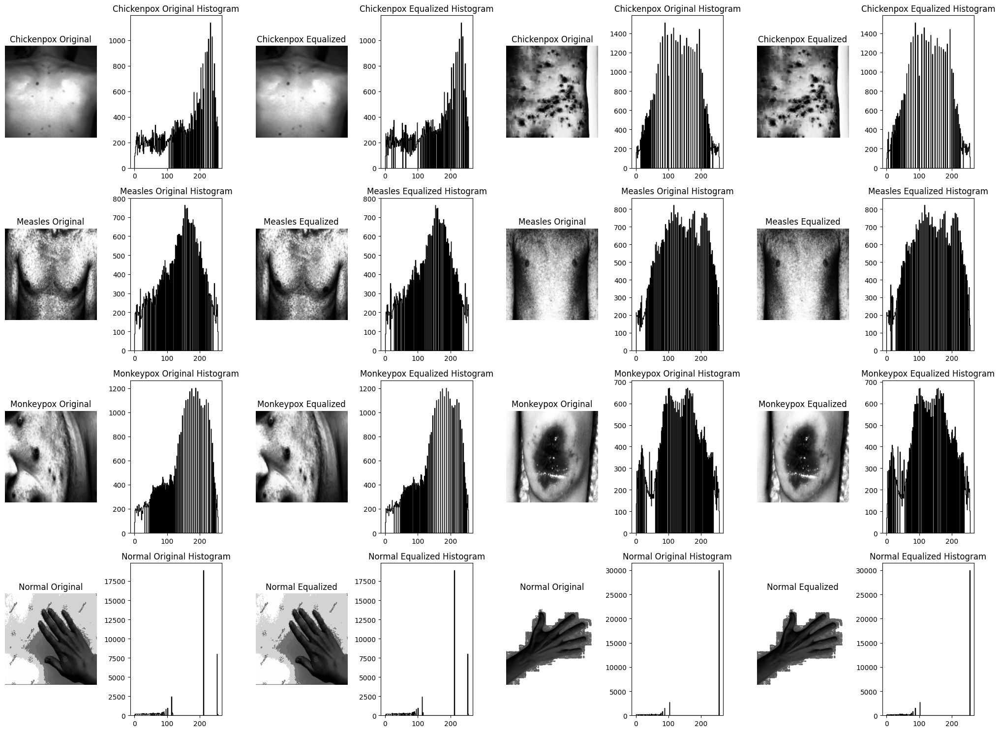

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define the dataset path
dataset_path = '/content/drive/MyDrive/project/equlized Monkeypox Skin Image Dataset'

# Set the number of sample images to display per class
num_samples_per_class = 2

# Create a subplot for displaying sample images and histograms
fig, axes = plt.subplots(len(classes), num_samples_per_class * 4, figsize=(20, 15))

# Get the list of classes (subdirectories)
classes = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])

# Loop through each class
for i, food_class in enumerate(classes):
    class_path = os.path.join(dataset_path, food_class)

    # Get all image files in the class directory
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]

    # Randomly select sample images for the current class
    sample_files = random.sample(image_files, min(num_samples_per_class, len(image_files)))

    # Display the sample images and histograms
    for j, file_name in enumerate(sample_files):
        img_path = os.path.join(class_path, file_name)

        # Load the image in grayscale
        img = cv2.imread(img_path, 0)

        # Apply histogram equalization
        equ = cv2.equalizeHist(img)

        # Plot the original image
        axes[i, j * 4].imshow(img, cmap='gray')
        axes[i, j * 4].axis('off')
        axes[i, j * 4].set_title(f"{food_class} Original")

        # Plot the histogram of the original image
        axes[i, j * 4 + 1].hist(img.ravel(), bins=256, histtype='step', color='black')
        axes[i, j * 4 + 1].set_title(f"{food_class} Original Histogram")

        # Plot the equalized image
        axes[i, j * 4 + 2].imshow(equ, cmap='gray')
        axes[i, j * 4 + 2].axis('off')
        axes[i, j * 4 + 2].set_title(f"{food_class} Equalized")

        # Plot the histogram of the equalized image
        axes[i, j * 4 + 3].hist(equ.ravel(), bins=256, histtype='step', color='black')
        axes[i, j * 4 + 3].set_title(f"{food_class} Equalized Histogram")

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

# New PART

# PAPER PREPROCESSING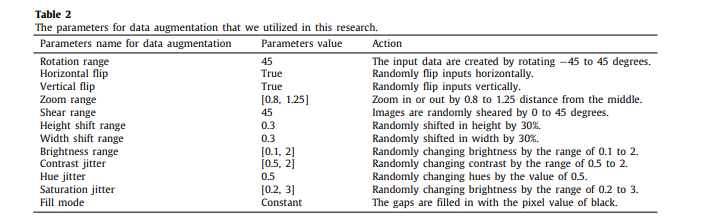

Found 770 images belonging to 4 classes.
10 augmented images saved to /content/drive/MyDrive/project/Augmented_Images_final


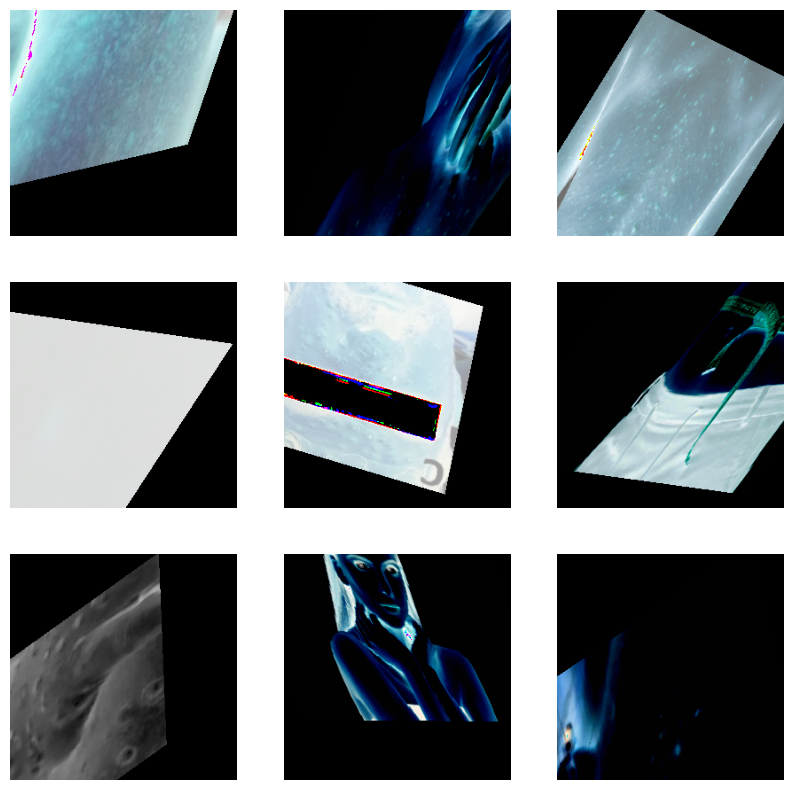

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the data augmentation parameters
data_gen = ImageDataGenerator(
    rotation_range=45,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=[0.8, 1.25],
    shear_range=45,
    height_shift_range=0.3,
    width_shift_range=0.3,
    brightness_range=[0.1, 2],
    fill_mode='constant',
    cval=0,
)

# Define the dataset directory
train_generator = data_gen.flow_from_directory(
    directory='/content/drive/MyDrive/project/Monkeypox Skin Image Dataset',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

# Directory to save augmented images
output_dir = '/content/drive/MyDrive/project/Augmented_Images_final'
os.makedirs(output_dir, exist_ok=True)

# Generate and save augmented images
num_images_to_save = 10  # Set how many augmented images to save
images_saved = 0

for images, labels in train_generator:
    for i, image in enumerate(images):
        if images_saved >= num_images_to_save:
            break
        # Convert image to uint8 for saving
        image_uint8 = (image * 255).astype(np.uint8)
        # Save the image using OpenCV
        output_path = os.path.join(output_dir, f'augmented_image_{images_saved + 1}.png')
        cv2.imwrite(output_path, cv2.cvtColor(image_uint8, cv2.COLOR_RGB2BGR))
        images_saved += 1

    if images_saved >= num_images_to_save:
        break

print(f"{images_saved} augmented images saved to {output_dir}")

# Display a few augmented images
plt.figure(figsize=(10, 10))
for i in range(min(9, num_images_to_save)):
    plt.subplot(3, 3, i+1)
    img = cv2.imread(os.path.join(output_dir, f'augmented_image_{i+1}.png'))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
plt.show()


# machine learing

# MobileNetV1 (svm) with undersampling data

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.linear_model import LogisticRegression
import random

In [ ]:
dataset_path = '/content/drive/MyDrive/NEW'

# Image preprocessing and feature extraction
def preprocess_and_extract_features(dataset_path, target_size=(224, 224)):
    features = []
    labels = []

    # Load MobileNet model without the top layer
    mobilenet_model = MobileNet(weights='imagenet', include_top=False, pooling='avg')

    # Traverse the dataset
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        if os.path.isdir(label_path):
            for image_name in os.listdir(label_path):
                image_path = os.path.join(label_path, image_name)

                try:
                    # Load and preprocess the image
                    img = load_img(image_path, target_size=target_size)
                    img_array = img_to_array(img)
                    img_array = preprocess_input(img_array)
                    img_array = np.expand_dims(img_array, axis=0)

                    # Extract features using MobileNet
                    feature_vector = mobilenet_model.predict(img_array)
                    features.append(feature_vector.flatten())
                    labels.append(label)
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

    return np.array(features), np.array(labels)

Extracting features...


<ipython-input-13-60ab6a40d66e>:20: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_model = MobileNet(weights='imagenet', include_top=False, pooling='avg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/

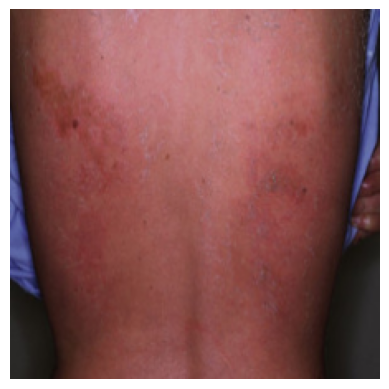

Actual label: Monkeypox
Predicted label: Monkeypox


In [ ]:
# Extract features and labels
print("Extracting features...")
X, y = preprocess_and_extract_features(dataset_path)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train SVM classifier
print("Training SVM classifier...")
svm_classifier = SVC(kernel='linear', C=1.0)
svm_classifier.fit(X_train, y_train)

# Make predictions
print("Making predictions...")
y_pred = svm_classifier.predict(X_test)

# Evaluate the model
print("Evaluating the model...")
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Select a random index from the test set to display an image
random_index = random.randint(0, len(X_test) - 1)
image_path_to_display = image_paths[random_index]
actual_label = y_test[random_index]
predicted_label = y_pred[random_index]


img_to_display = load_img(image_path_to_display, target_size=(224, 224))
plt.imshow(img_to_display)
plt.axis('off')
plt.show()


print(f"Actual label: {actual_label}")
print(f"Predicted label: {predicted_label}")

# MobileNetV1 (LR)

In [ ]:
def preprocess_and_extract_features(dataset_path, target_size=(224, 224)):
    features = []
    labels = []
    image_paths = []  # To store image paths for displaying later

    # Load MobileNet model without the top layer
    mobilenet_model = MobileNet(weights='imagenet', include_top=False, pooling='avg')

    # Traverse the dataset
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        if os.path.isdir(label_path):
            for image_name in os.listdir(label_path):
                image_path = os.path.join(label_path, image_name)

                try:
                    # Load and preprocess the image
                    img = load_img(image_path, target_size=target_size)
                    img_array = img_to_array(img)
                    img_array = preprocess_input(img_array)
                    img_array = np.expand_dims(img_array, axis=0)

                    # Extract features using MobileNet
                    feature_vector = mobilenet_model.predict(img_array)
                    features.append(feature_vector.flatten())
                    labels.append(label)
                    image_paths.append(image_path)  # Store the image path
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

    return np.array(features), np.array(labels), image_paths

Extracting features...


<ipython-input-11-975011fcfd94>:23: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenet_model = MobileNet(weights='imagenet', include_top=False, pooling='avg')


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━

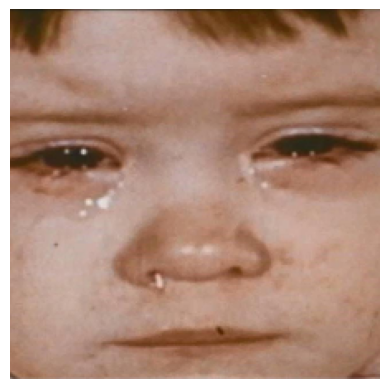

Actual label: Measles
Predicted label: Measles


In [ ]:
# Extract features and labels
print("Extracting features...")
X, y, image_paths = preprocess_and_extract_features(dataset_path)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train Logistic Regression classifier
print("Training Logistic Regression classifier...")
lr_classifier = LogisticRegression(max_iter=1000)  # Added max_iter to ensure convergence
lr_classifier.fit(X_train, y_train)

# Make predictions
print("Making predictions...")
y_pred = lr_classifier.predict(X_test)

# Evaluate the model
print("Evaluating the model...")
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Select a random index from the test set to display an image
random_index = random.randint(0, len(X_test) - 1)
image_path_to_display = image_paths[random_index]
actual_label = y_test[random_index]
predicted_label = y_pred[random_index]

# Load and display the image
img_to_display = load_img(image_path_to_display, target_size=(224, 224))
plt.imshow(img_to_display)
plt.axis('off')  # Hide axes
plt.show()


print(f"Actual label: {actual_label}")
print(f"Predicted label: {predicted_label}")

# VGG 16 (SVM)

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
import random

In [ ]:
# Image preprocessing and feature extraction
def preprocess_and_extract_features(dataset_path, target_size=(224, 224)):
    features = []
    labels = []
    image_paths = []  # To store image paths for displaying later

    # Load VGG16 model without the top layer (for feature extraction)
    vgg16_model = VGG16(weights='imagenet', include_top=False, pooling='avg')

    # Traverse the dataset
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)
        if os.path.isdir(label_path):
            for image_name in os.listdir(label_path):
                image_path = os.path.join(label_path, image_name)

                try:
                    # Load and preprocess the image
                    img = load_img(image_path, target_size=target_size)
                    img_array = img_to_array(img)
                    img_array = preprocess_input(img_array)
                    img_array = np.expand_dims(img_array, axis=0)

                    # Extract features using VGG16
                    feature_vector = vgg16_model.predict(img_array)
                    features.append(feature_vector.flatten())
                    labels.append(label)
                    image_paths.append(image_path)  # Store the image path
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

    return np.array(features), np.array(labels), image_paths

Extracting features...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step
1/1 ━━━━━━━━━━━━━━━━

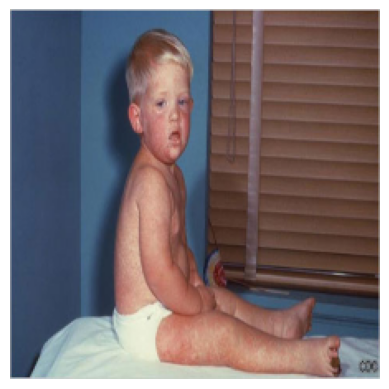

Actual label: Measles
Predicted label: Measles


In [ ]:
# Extract features and labels
print("Extracting features...")
X, y, image_paths = preprocess_and_extract_features(dataset_path)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train SVM classifier
print("Training SVM classifier...")
svm_classifier = SVC(kernel='linear', C=1.0)  # SVM with a linear kernel
svm_classifier.fit(X_train, y_train)

# Make predictions
print("Making predictions...")
y_pred = svm_classifier.predict(X_test)

# Evaluate the model
print("Evaluating the model...")
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Select a random index from the test set to display an image
random_index = random.randint(0, len(X_test) - 1)
image_path_to_display = image_paths[random_index]
actual_label = y_test[random_index]
predicted_label = y_pred[random_index]

# Load and display the image
img_to_display = load_img(image_path_to_display, target_size=(224, 224))
plt.imshow(img_to_display)
plt.axis('off')  # Hide axes
plt.show()

print(f"Actual label: {actual_label}")
print(f"Predicted label: {predicted_label}")

# DEEP-LEARNING MODEL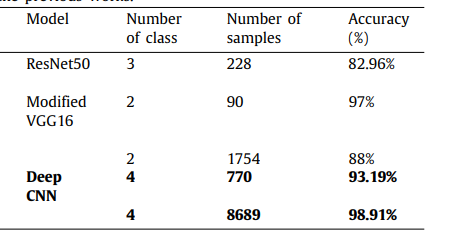

# Modified VGG16 Model

In [ ]:
data_path = '/content/drive/MyDrive/CAD/ project/balanced Monkeypox Skin Image Dataset'

In [ ]:
import os

print("Checking folder structure in DATA directory:")
for folder in os.listdir(data_path):
    folder_path = os.path.join(data_path, folder)
    print(f"Folder: {folder} - Contains {len(os.listdir(folder_path))} images")


Checking folder structure in DATA directory:
Folder: Measles - Contains 500 images
Folder: Monkeypox - Contains 500 images
Folder: Normal - Contains 500 images
Folder: Chickenpox - Contains 500 images


In [ ]:
data_path = '/content/drive/MyDrive/CAD/ project/balanced Monkeypox Skin Image Dataset'
base_dir = '/content/drive/MyDrive/Processed_Data'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

In [ ]:
if not os.path.exists(base_dir):
    os.makedirs(base_dir)
if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(val_dir):
    os.makedirs(val_dir)

In [ ]:
def prepare_data(data_path, train_dir, val_dir, split_ratio=0.8):
    for folder in os.listdir(data_path):
        folder_path = os.path.join(data_path, folder)
        if not os.path.isdir(folder_path):
            continue  # Skip non-folder files

        images = os.listdir(folder_path)
        train_images, val_images = train_test_split(images, train_size=split_ratio, random_state=42)

        # Create subfolders for each class in train and val directories
        train_class_dir = os.path.join(train_dir, folder)
        val_class_dir = os.path.join(val_dir, folder)
        os.makedirs(train_class_dir, exist_ok=True)
        os.makedirs(val_class_dir, exist_ok=True)

        # Move images to respective directories
        for img in train_images:
            shutil.copy(os.path.join(folder_path, img), os.path.join(train_class_dir, img))

        for img in val_images:
            shutil.copy(os.path.join(folder_path, img), os.path.join(val_class_dir, img))

        print(f"Class: {folder} - Train: {len(train_images)}, Validation: {len(val_images)}")


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split
prepare_data(data_path, train_dir, val_dir)

Class: Measles - Train: 400, Validation: 100
Class: Monkeypox - Train: 400, Validation: 100
Class: Normal - Train: 400, Validation: 100
Class: Chickenpox - Train: 400, Validation: 100


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_modified_vgg16(input_shape, num_classes):
    # Load VGG16 with pretrained weights and exclude the top layers
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom layers on top
    x = Flatten()(base_model.output)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    output = Dense(num_classes, activation='softmax')(x)


    model = Model(inputs=base_model.input, outputs=output)

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Set paths to train and validation directories
train_dir = "/content/drive/MyDrive/Processed_Data/train"
val_dir = "/content/drive/MyDrive/Processed_Data/val"

# Define parameters
input_shape = (224, 224, 3)
batch_size = 32
num_classes = len(os.listdir(train_dir))


train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1./255)

# Load datasets
train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(224, 224), batch_size=batch_size, class_mode='categorical')
val_generator = val_datagen.flow_from_directory(
    val_dir, target_size=(224, 224), batch_size=batch_size, class_mode='categorical')

# Create the model
model = create_modified_vgg16(input_shape, num_classes)

# Train the model
epochs = 10
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator
)

# Save the model
model.save("modified_vgg16_model.h5")

# Evaluate the model
loss, accuracy = model.evaluate(val_generator)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")


Found 1600 images belonging to 4 classes.
Found 400 images belonging to 4 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 ━━━━━━━━━━━━━━━━━━━━ 1177s 24s/step - accuracy: 0.3466 - loss: 3.2398 - val_accuracy: 0.6550 - val_loss: 0.9435
Epoch 2/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1222s 24s/step - accuracy: 0.5696 - loss: 1.0013 - val_accuracy: 0.7375 - val_loss: 0.7758
Epoch 3/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1254s 24s/step - accuracy: 0.6368 - loss: 0.8781 - val_accuracy: 0.7600 - val_loss: 0.6674
Epoch 4/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1204s 24s/step - accuracy: 0.7101 - loss: 0.7139 - val_accuracy: 0.8275 - val_loss: 0.5650
Epoch 5/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1167s 23s/step - accuracy: 0.7359 - loss: 0.6505 - val_accuracy: 0.8275 - val_loss: 0.5187
Epoch 6/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1251s 24s/step - accuracy: 0.7416 - loss: 0.6087 - val_accuracy: 0.8375 - val_loss: 0.4974
Epoch 7/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1169s 23s/step - accuracy: 0.7745 - loss: 0.5971 - val_accuracy: 0.8375 - val_loss: 0.4882
Epoch 8/10
50/50 ━━━━━━━━━━━━━━━━━━━━ 1193s 24s/step - accuracy: 0.7870 - loss: 0.5387 - val_accuracy: 0.820

13/13 ━━━━━━━━━━━━━━━━━━━━ 241s 19s/step - accuracy: 0.8879 - loss: 0.3898
Validation Loss: 0.4167744517326355
Validation Accuracy: 0.8774999976158142


13/13 ━━━━━━━━━━━━━━━━━━━━ 240s 18s/step
Confusion Matrix:
[[24 30 25 21]
 [24 24 22 30]
 [22 19 24 35]
 [22 25 20 33]]
Sensitivity: 0.2625
Specificity: 0.7542
PPV (Positive Predictive Value): 0.2617
NPV (Negative Predictive Value): 0.7543


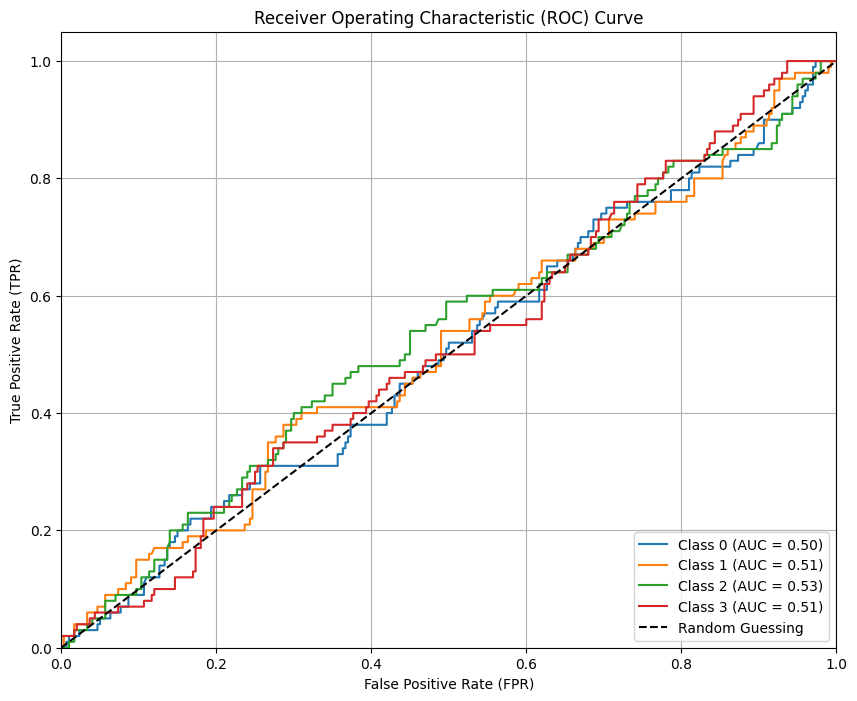

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

def evaluate_model(model, val_generator):
    # Predict probabilities
    y_pred_probs = model.predict(val_generator)
    y_pred = np.argmax(y_pred_probs, axis=1)
    y_true = val_generator.classes  # True labels

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:")
    print(cm)

    # Extract metrics from confusion matrix
    tp = np.diag(cm)  # True positives for each class
    fp = cm.sum(axis=0) - tp  # False positives for each class
    fn = cm.sum(axis=1) - tp  # False negatives for each class
    tn = cm.sum() - (tp + fp + fn)  # True negatives for each class

    # Calculate sensitivity, specificity, PPV, and NPV
    sensitivity = tp / (tp + fn + 1e-8)
    specificity = tn / (tn + fp + 1e-8)
    ppv = tp / (tp + fp + 1e-8)  # Positive Predictive Value
    npv = tn / (tn + fn + 1e-8)  # Negative Predictive Value

    print(f"Sensitivity: {np.mean(sensitivity):.4f}")
    print(f"Specificity: {np.mean(specificity):.4f}")
    print(f"PPV (Positive Predictive Value): {np.mean(ppv):.4f}")
    print(f"NPV (Negative Predictive Value): {np.mean(npv):.4f}")

    # Calculate ROC curve and AUC for each class
    n_classes = len(val_generator.class_indices)
    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(n_classes):
        y_true_binary = (y_true == i).astype(int)
        y_pred_probs_class = y_pred_probs[:, i]
        fpr[i], tpr[i], _ = roc_curve(y_true_binary, y_pred_probs_class)
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curves for all classes
    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

    # Plot baseline
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guessing')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate (FPR)")
    plt.ylabel("True Positive Rate (TPR)")
    plt.title("Receiver Operating Characteristic (ROC) Curve")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

# Example usage after training
evaluate_model(model, val_generator)


In [ ]:
model.save("modified_vgg16_model.h5")



In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def predict_single_image_with_model(model, image_path, class_indices):

    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  #


    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)
    confidence = np.max(predictions)

    #
    class_labels = {v: k for k, v in class_indices.items()}
    predicted_label = class_labels[predicted_class]

    print(f" expext class: {predicted_label} (accurat: {confidence:.2f})")

#
image_path = "/content/drive/MyDrive/Processed_Data/val/Monkeypox/monkeypox102.png"
predict_single_image_with_model(model, image_path, train_generator.class_indices)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
 expext class: Monkeypox (accurat: 0.61)


In [ ]:
#
image_path = "/content/drive/MyDrive/Processed_Data/val/Measles/measles11_aug_148.jpg"
predict_single_image_with_model(model, image_path, train_generator.class_indices)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
 expext class: Measles (accurat: 0.55)


# **CNN MODEL**

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [ ]:
data_path = '/content/drive/MyDrive/NEW'

In [ ]:
import os

print("Checking folder structure in DATA directory:")
for folder in os.listdir(data_path):
    folder_path = os.path.join(data_path, folder)
    print(f"Folder: {folder} - Contains {len(os.listdir(folder_path))} images")


Checking folder structure in DATA directory:
Folder: Measles - Contains 91 images
Folder: Chickenpox - Contains 107 images
Folder: Monkeypox - Contains 107 images
Folder: Normal - Contains 107 images


In [ ]:
data_path = '/content/drive/MyDrive/NEW'
base_dir = '/content/drive/MyDrive/Processed_Data'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')

In [ ]:
if not os.path.exists(base_dir):
    os.makedirs(base_dir)
if not os.path.exists(train_dir):
    os.makedirs(train_dir)
if not os.path.exists(val_dir):
    os.makedirs(val_dir)

In [ ]:
def prepare_data(data_path, train_dir, val_dir, split_ratio=0.8):
    for folder in os.listdir(data_path):
        folder_path = os.path.join(data_path, folder)
        if not os.path.isdir(folder_path):
            continue  # Skip non-folder files

        images = os.listdir(folder_path)
        train_images, val_images = train_test_split(images, train_size=split_ratio, random_state=42)

        # Create subfolders for each class in train and val directories
        train_class_dir = os.path.join(train_dir, folder)
        val_class_dir = os.path.join(val_dir, folder)
        os.makedirs(train_class_dir, exist_ok=True)
        os.makedirs(val_class_dir, exist_ok=True)

        # Move images to respective directories
        for img in train_images:
            shutil.copy(os.path.join(folder_path, img), os.path.join(train_class_dir, img))

        for img in val_images:
            shutil.copy(os.path.join(folder_path, img), os.path.join(val_class_dir, img))

        print(f"Class: {folder} - Train: {len(train_images)}, Validation: {len(val_images)}")


In [ ]:
prepare_data(data_path, train_dir, val_dir)

Class: Measles - Train: 72, Validation: 19
Class: Chickenpox - Train: 85, Validation: 22
Class: Monkeypox - Train: 85, Validation: 22
Class: Normal - Train: 85, Validation: 22


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

model = tf.keras.models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(4, activation='softmax')
])
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 327 images belonging to 5 classes.
Found 85 images belonging to 5 classes.


In [ ]:
def check_folders(base_dir):
    for folder in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder)
        if os.path.isdir(folder_path):
            images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
            print(f"Class: {folder} - Contains {len(images)} images")
        else:
            print(f"Unexpected file or folder found: {folder_path}")

print("Checking train directory:")
check_folders(train_dir)

print("Checking validation directory:")
check_folders(val_dir)


Checking train directory:
Class: .ipynb_checkpoints - Contains 0 images
Class: Measles - Contains 72 images
Class: Chickenpox - Contains 85 images
Class: Monkeypox - Contains 85 images
Class: Normal - Contains 85 images
Checking validation directory:
Class: .ipynb_checkpoints - Contains 0 images
Class: Measles - Contains 19 images
Class: Chickenpox - Contains 22 images
Class: Monkeypox - Contains 22 images
Class: Normal - Contains 22 images


In [ ]:
def clean_directories(base_dir):
    for folder in os.listdir(base_dir):
        folder_path = os.path.join(base_dir, folder)
        if folder == '.ipynb_checkpoints' or not os.path.isdir(folder_path):
            print(f"Removing unwanted folder: {folder_path}")
            shutil.rmtree(folder_path)

clean_directories(train_dir)
clean_directories(val_dir)


Removing unwanted folder: /content/drive/MyDrive/Processed_Data/train/.ipynb_checkpoints
Removing unwanted folder: /content/drive/MyDrive/Processed_Data/val/.ipynb_checkpoints


In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 327 images belonging to 4 classes.
Found 85 images belonging to 4 classes.


In [ ]:
history = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator
)

Epoch 1/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.9260 - loss: 0.2485 - val_accuracy: 0.5412 - val_loss: 1.9413
Epoch 2/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9527 - loss: 0.2016 - val_accuracy: 0.4824 - val_loss: 2.6632
Epoch 3/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.9113 - loss: 0.2256 - val_accuracy: 0.5176 - val_loss: 2.2139
Epoch 4/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.9413 - loss: 0.1780 - val_accuracy: 0.5059 - val_loss: 2.9012
Epoch 5/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.9233 - loss: 0.1722 - val_accuracy: 0.5176 - val_loss: 2.8770
Epoch 6/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step - accuracy: 0.9511 - loss: 0.1502 - val_accuracy: 0.4235 - val_loss: 3.5526
Epoch 7/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9626 - loss: 0.1096 - val_accuracy: 0.4118 - val_loss: 3.6062
Epoch 8/15
11/11 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.9275 - loss: 0.2901 - val_accuracy: 0.4471 - val_loss:

In [ ]:
model.save('/content/drive/MyDrive/CNN_Model/cnn_model.h5')

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from PIL import Image
import random

model = load_model('/content/drive/MyDrive/CNN_Model/cnn_model.h5')

In [ ]:
data_path = '/content/drive/MyDrive/NEW'

selected_class = random.choice(os.listdir(data_path))
class_path = os.path.join(data_path, selected_class)

while not os.path.isdir(class_path):
    selected_class = random.choice(os.listdir(data_path))
    class_path = os.path.join(data_path, selected_class)

selected_image = random.choice(os.listdir(class_path))
image_path = os.path.join(class_path, selected_image)

In [ ]:
img = Image.open(image_path).convert('RGB')
img_resized = img.resize((150, 150))

img_array = np.array(img_resized) / 255.0
img_array = np.expand_dims(img_array, axis=0)

In [ ]:
predictions = model.predict(img_array)
predicted_class_index = np.argmax(predictions, axis=1)[0]

class_labels = ['Measles', 'Chickenpox', 'Monkeypox', 'Normal']
predicted_class = class_labels[predicted_class_index]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


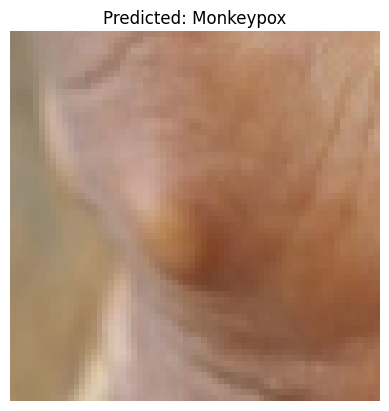

Actual: Monkeypox
Predicted: Monkeypox


In [ ]:
plt.imshow(img)
plt.axis('off')
plt.title(f"Predicted: {predicted_class}")
plt.show()

print(f"Actual: {selected_class}")
print(f"Predicted: {predicted_class}")

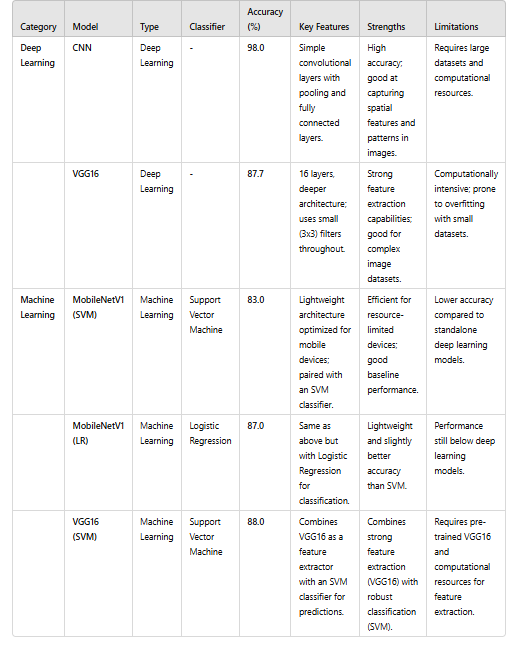